# Code to analyze calculated shapley values

### 1. Load Pretrained inception3 model and Data
### 2. Load Precalculated shapley values for validation set
### 3. Shapley plots
refer to https://github.com/leexa90/Explainable_AI_image_classification/blob/master/SHAPLEY_VALUES_LEGEND.pdf for legend
### 4. Correlating % of Leaf Cover in negative/positive shapley areas to similarity to training set  (in progress)

In [176]:
# -*- coding: utf-8 -*-
import matplotlib.pyplot as plt
import numpy as np
import gzip
from inception_v3_archisen import InceptionV3  # load inception3
import keras
from skimage.segmentation import slic

### 1. Load Pretrained inception3 model and Data

In [2]:
from keras.layers import Input
Input_model = Input((299,299,3))  #299 can be anynumber or even None if undefined
Incept_model = InceptionV3(include_top=False, #chop of top
                weights='imagenet', #get pretrained weights
                input_tensor=Input_model, #trying uint8 image format
                input_shape=(299,299,3), #ignore
                pooling=None, #ignore
                classes=1000) # classes: optional number only if top is true

output = Incept_model.output
output # shape of tensor is  (batch_size, Length,Width, Channels) 
output2 = keras.layers.GlobalAveragePooling2D()(output) 
output2 #global max pooling finds the max point in each channel. Frequently used, max finds the strongest signal. Average is also reasonable
output2 = keras.layers.Dropout(0.5)(output2)
output3 = keras.layers.Dense(96,activation='relu') (output2) # dense neural network with 50 layers
output4 = keras.layers.Dense(4, activation="softmax") (output3) # output 3 classes in probabiltites with softmax

from keras.models import Model
from keras.layers import Lambda
model = Model(Input_model,output4) #using logits layer
model.compile(loss = "categorical_crossentropy",
                    optimizer = 'adam',#ptimizers.SGD(lr=0.1),
                    metrics=['categorical_crossentropy',"accuracy"])

from keras.callbacks import EarlyStopping, ModelCheckpoint
model_path = 'transfer_model.h5'
callbacks = [
        EarlyStopping(
            monitor='val_categorical_crossentropy', 
            patience=3, # stop training at 3
            verbose=0),
        
        ModelCheckpoint(
            model_path , 
            monitor='val_categorical_crossentropy', 
            save_best_only=True, 
            verbose=0)
    ]
batch_size =32
from keras.callbacks import TensorBoard
tbCallBack = TensorBoard(log_dir='./log', histogram_freq=1,
                         write_graph=True,
                         write_grads=True,
                         batch_size=batch_size,
                         write_images=True)


In [3]:
c0 = np.load(gzip.GzipFile('./train/c_30.npy.gz'))[::skip] # tomato late blight
c1 = np.load(gzip.GzipFile('./train/c_31.npy.gz'))[::skip] # Tomato leaf mold 
c2 = np.load(gzip.GzipFile('./train/c_32.npy.gz'))[::skip] # Septrio leaf spot
c3 = np.load(gzip.GzipFile('./train/c_37.npy.gz'))[::skip] # healthy
y0 = np.array([[1,0,0,0],]*c0.shape[0]) #one hot encoded labels
y1 = np.array([[0,1,0,0],]*c1.shape[0])
y2 = np.array([[0,0,1,0],]*c2.shape[0])
y3 = np.array([[0,0,0,1],]*c3.shape[0])

# concateneate all classes together
X ,y = np.concatenate([c0,c1,c2,c3],axis=0), np.concatenate([y0,y1,y2,y3],axis=0)
del c0,c1,c2,c3
del y0,y1,y2,y3 #clear RAM

X_tr ,y_tr = X[0::2,], y[0::2,]
X_val , y_val = X[1::2,],y[1::2,]
del X ,y
import gc
gc.collect()

16

In [4]:
model.load_weights('transfer_model.h5') #trained with astar super computer for 30mins



### 2. Load Precalculated shapley values for validation set

In [121]:
dictt= np.load(gzip.GzipFile('dictt_BetterSampling_100_bk0.npy.gz')).item()
print len(dictt)
print len(X_val)

411
1231


In [6]:
# function gets leaf mask in areas with much higher green than red/blue
def get_approx_mask(image_id,dictt=dictt):
    # quick function to get mask out
    i = image_id
    picG = dictt[i][0][:,:,1]*2 - dictt[i][0][:,:,0] - dictt[i][0][:,:,2]
    picR = dictt[i][0][:,:,0]*1.4 - dictt[i][0][:,:,1] - dictt[i][0][:,:,2]
    meanG = np.mean(np.concatenate(picG ))
    stdG = np.std(np.concatenate(picG))
    meanR = np.mean(np.concatenate(picR ))
    stdR = np.std(np.concatenate(picR))
    return (picG > meanG)*(picR < (meanR+stdR))

In [7]:
for i in dictt.keys():
    assert np.mean(dictt[i][0]==X_val[i])==1
print 'Pictures tally'

Pictures tally


In [ ]:
dictt[0]
'''
format [
image,
shapley_val_late_blight,
shapley_val_leaf_spot,
shapley_val_leaf_mould,
shapley_val_healthy,
super_pixel_image,
true_labels]
'''

### 3. Shapley plots
refer to https://github.com/leexa90/Explainable_AI_image_classification/blob/master/SHAPLEY_VALUES_LEGEND.pdf 
for legend

Plotting : 0


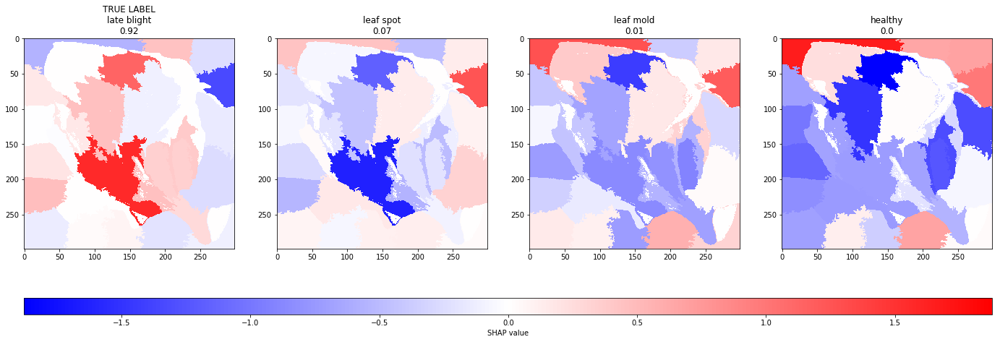

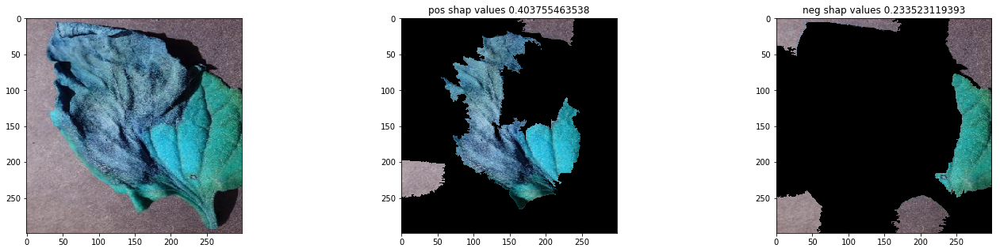

Plotting : 120


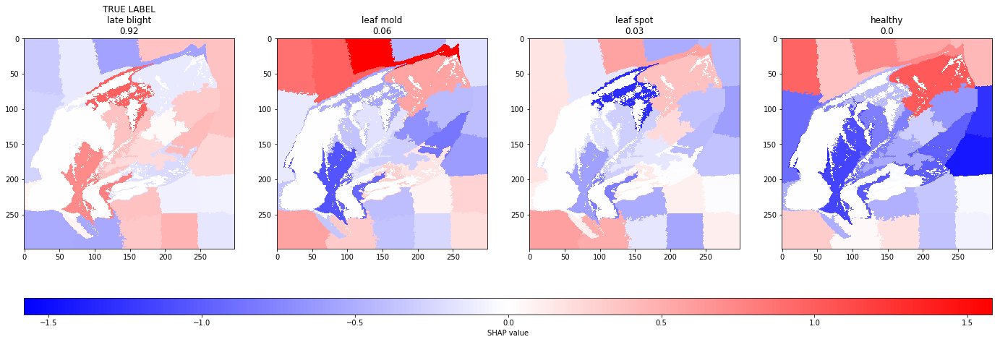

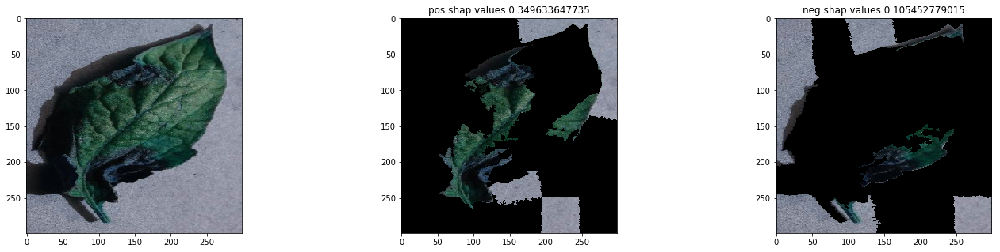

Plotting : 240


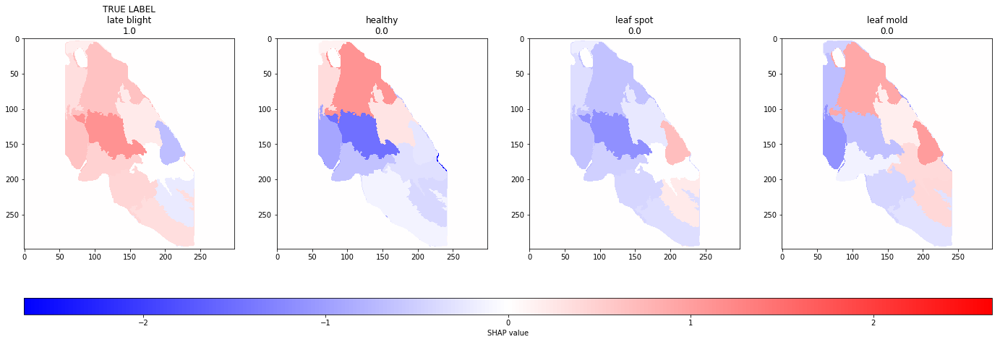

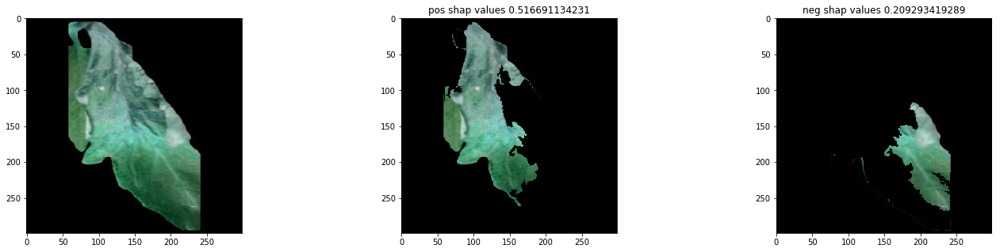

Plotting : 360


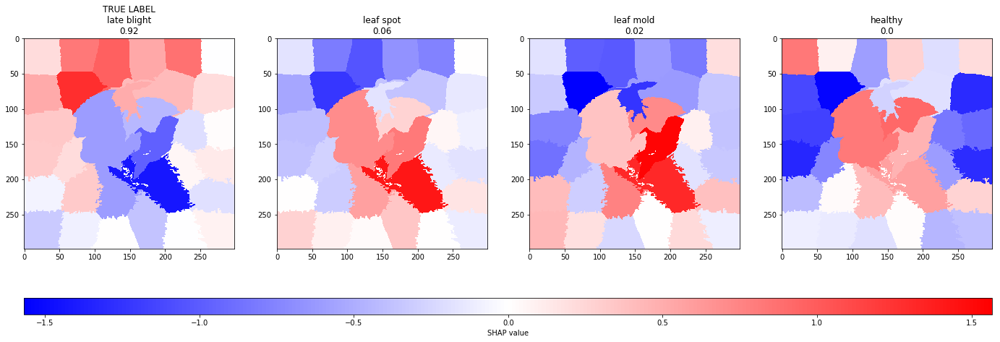

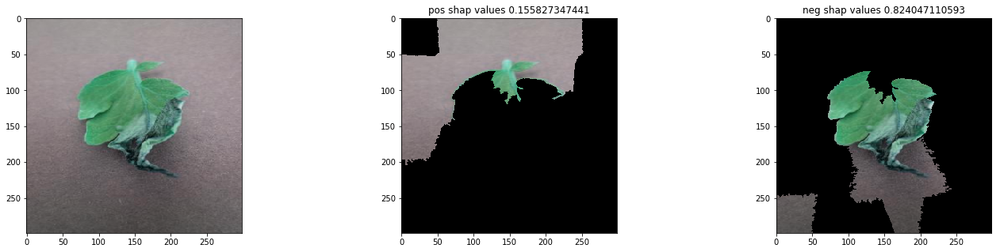

Plotting : 480


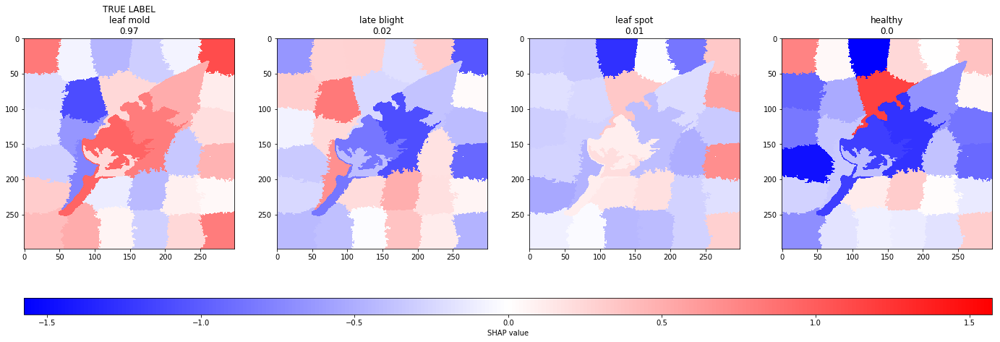

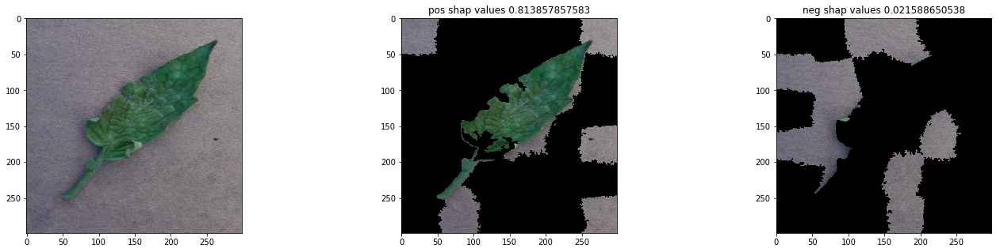

Plotting : 600


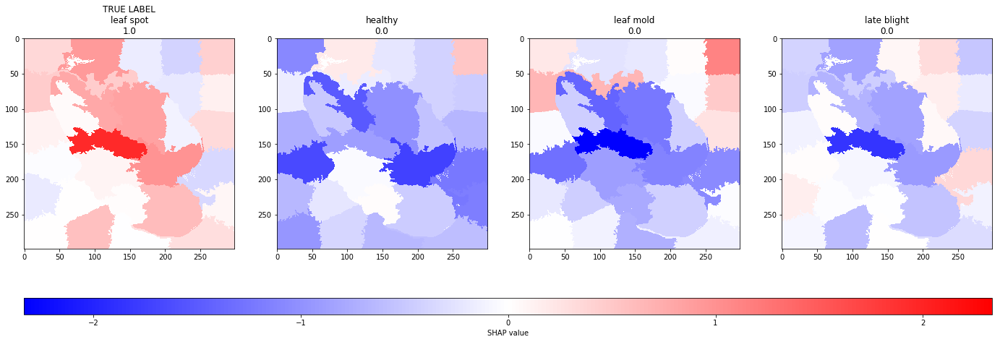

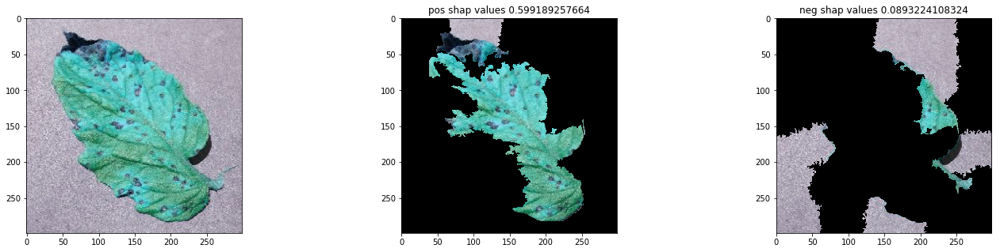

Plotting : 840


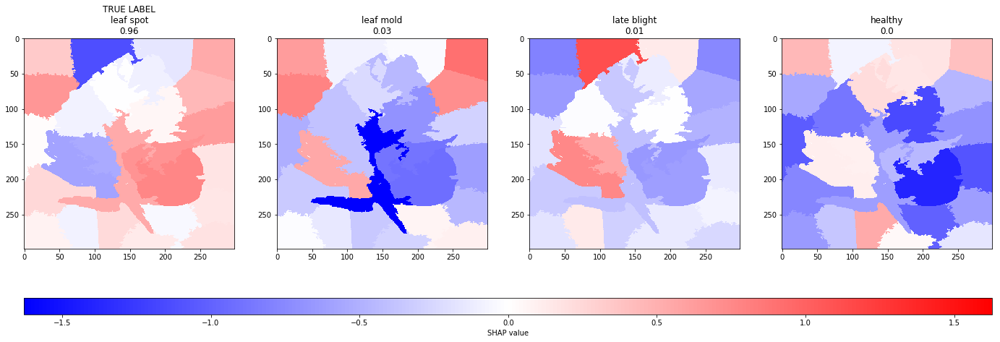

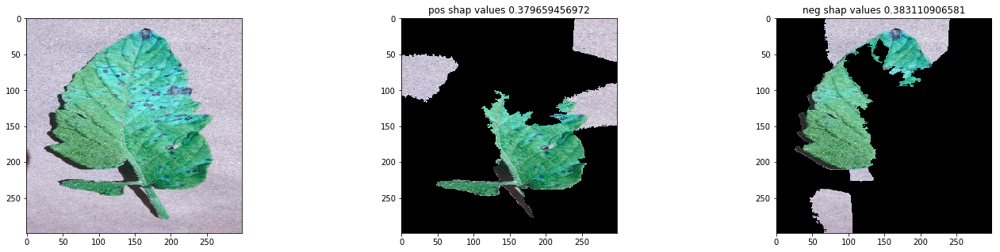

Plotting : 960


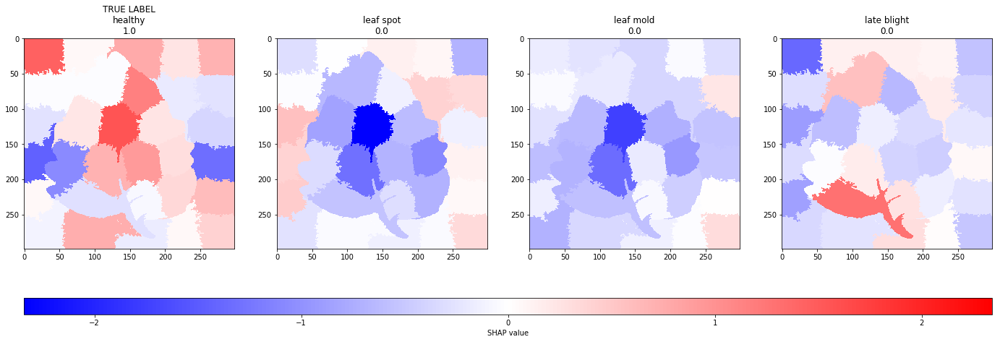

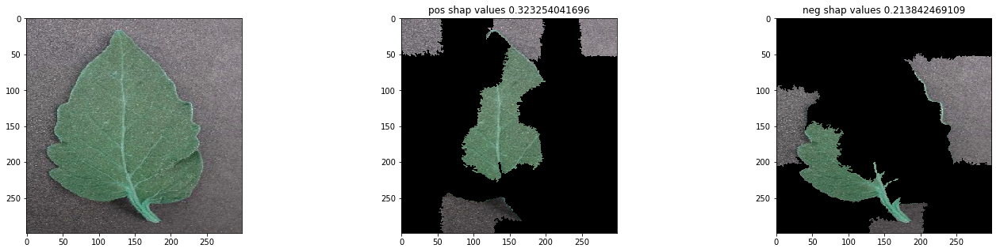

Plotting : 1080


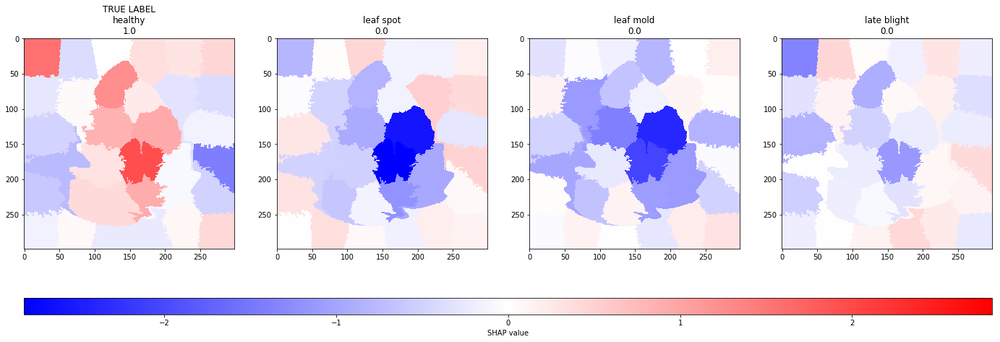

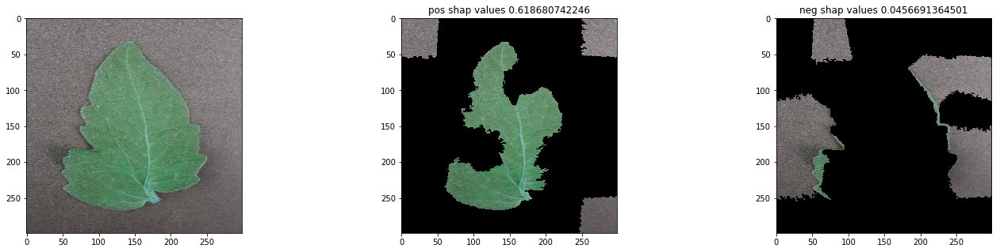

Plotting : 1200


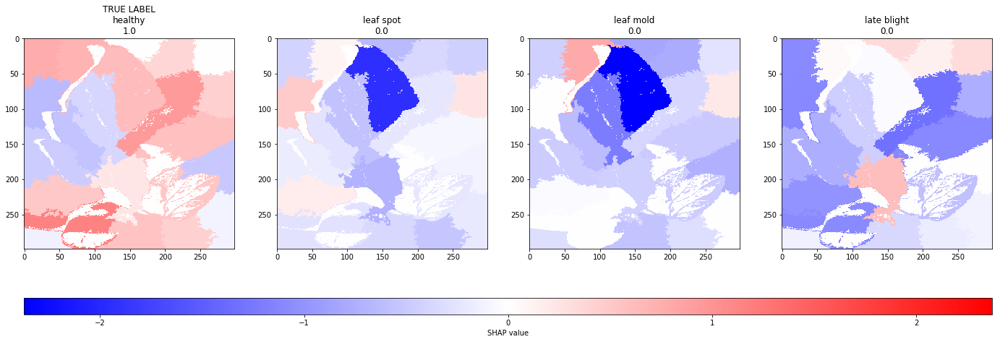

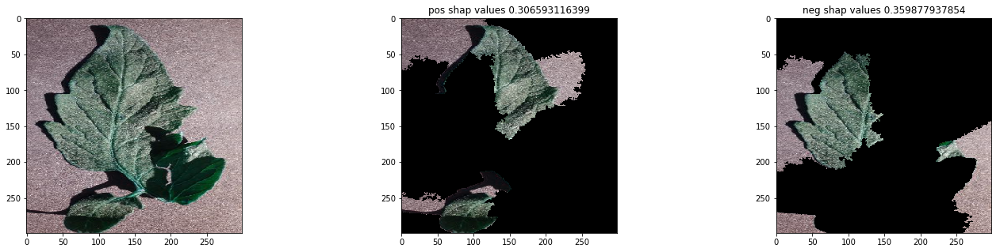

In [71]:
class_names={0:'late blight',1:'leaf mold',2:'leaf spot',3:'healthy'}
from matplotlib import cm
for i in sorted(dictt.keys())[::20]:
    img = dictt[i][0]
    phi = dictt[i][1]
    actual_class = class_names[np.argmax(y_val[i])]
    preds = map(lambda x : np.round(x,2),model.predict(np.array([img]))[0])
    if max(preds) > 0.9: # for very confident predictions
        print 'Plotting :',i
        if actual_class != class_names[np.argmax(preds)]:
            print 'THE FOLLOWING WAS PREDICTED WRONGLY'
        max_val = max(np.abs(np.concatenate(phi)))
        segments_slic = dictt[i][2]
        new_image = np.zeros((299,299))
        f,ax = plt.subplots(1,4,figsize=(12*2,2*4.2))
        counter  = 3
        for ii in np.argsort(preds)[::]:
          for j in range(299):
            for k in range(299):
              new_image[j,k] = phi[ii][segments_slic[j,k]]
          if class_names[ii] == actual_class:
              ax[counter].set_title('TRUE LABEL\n'+class_names[ii]+'\n'+str(preds[ii])[:4]   )
          else:
              ax[counter].set_title(class_names[ii]+'\n'+str(preds[ii])[:4]   )
          cax = ax[counter].imshow( (np.mean(img,-1) > 0.1)*1*new_image, 
                                   vmin=-max_val, vmax=max_val,cmap = plt.cm.bwr)
          counter += -1
        cb = plt.colorbar(cax,  ax=ax.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
        #cbar = plt.colorbar(cax,ticks=[-1.5,-1,-0.75,-0.5,-0.25, 0,.25,.5, 75, 1,1.5], orientation='horizontal')
        plt.show()
        f,ax = plt.subplots(1,3,figsize=(12*2,2*2.5))
        ax[0].imshow(img)
        lower_bd = np.percentile(np.concatenate(new_image),30)
        upper_bd = np.percentile(np.concatenate(new_image),70)
        new_image= np.stack([new_image]*3,-1)
        shap_pos_img = (new_image > upper_bd)
        shap_neg_img = (new_image < lower_bd)
        mask = get_approx_mask(i)
        pos_shap_and_leaf = shap_pos_img[:,:,0]*mask
        neg_shap_and_leaf = shap_neg_img[:,:,0]*mask
        ax[1].imshow(img*shap_pos_img)
        ax[1].set_title('pos shap values %s' %(1.0*np.sum(pos_shap_and_leaf)/np.sum(mask)))
        ax[2].imshow(img*shap_neg_img)
        ax[2].set_title('neg shap values %s' %(1.0*np.sum(neg_shap_and_leaf)/np.sum(mask)))
        plt.show()


Plotting : 180


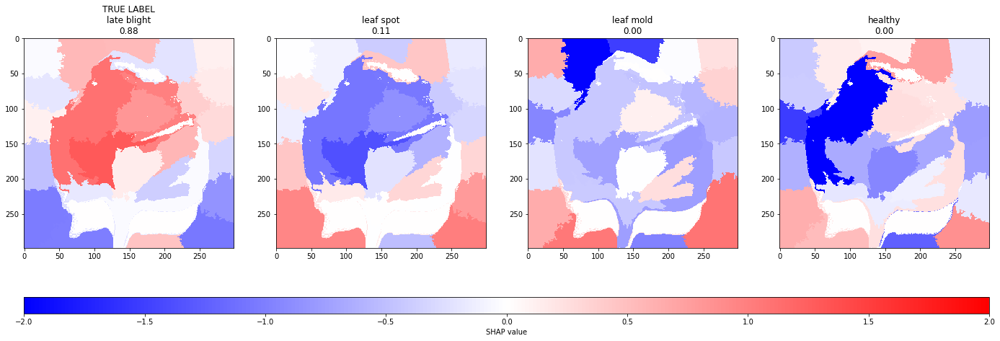

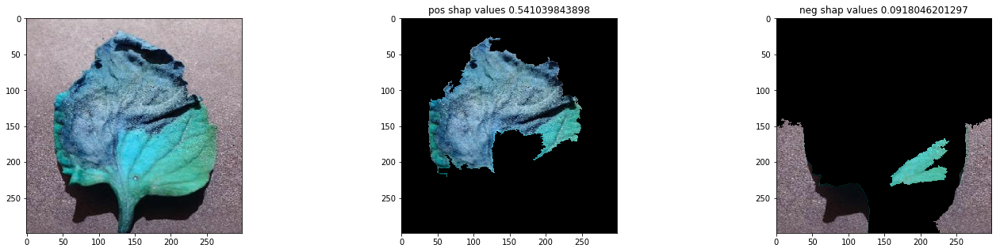

Plotting : 420


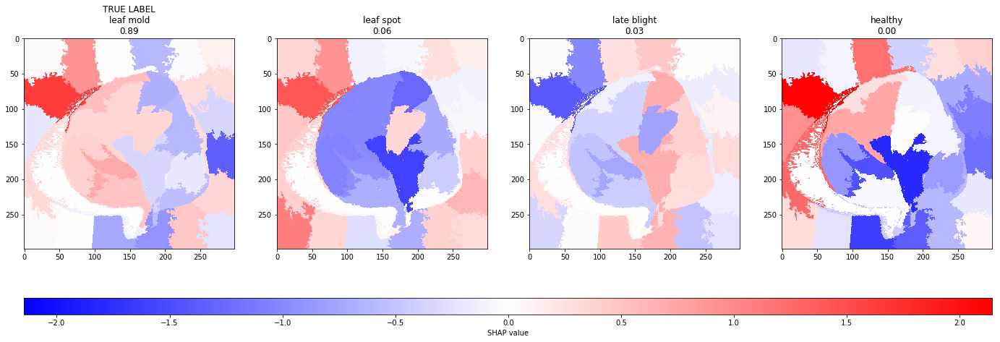

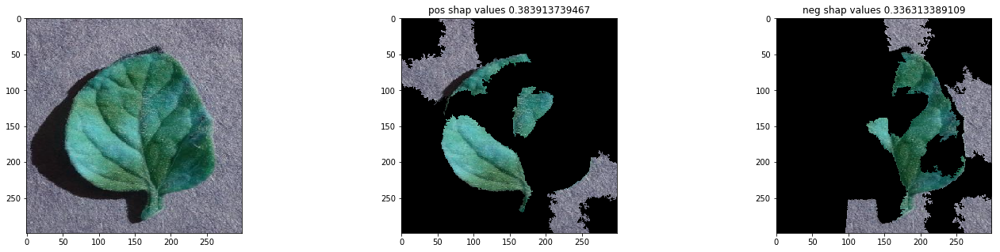

Plotting : 660
THE FOLLOWING WAS PREDICTED WRONGLY


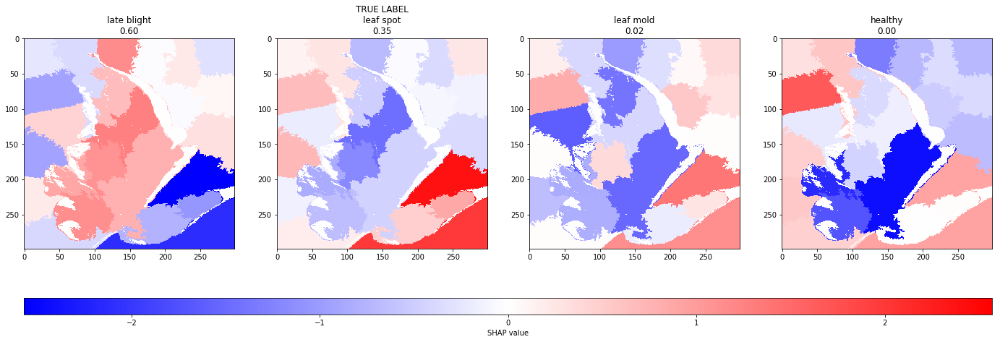

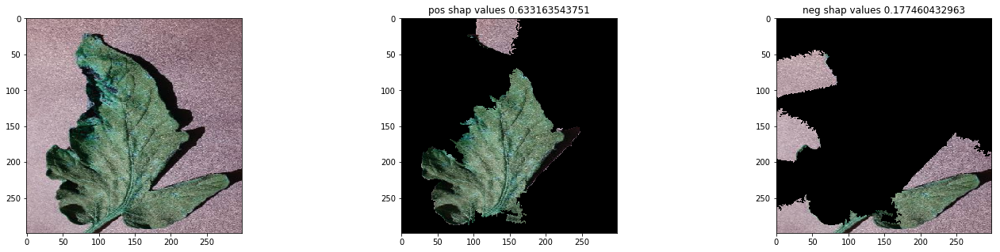

Plotting : 720


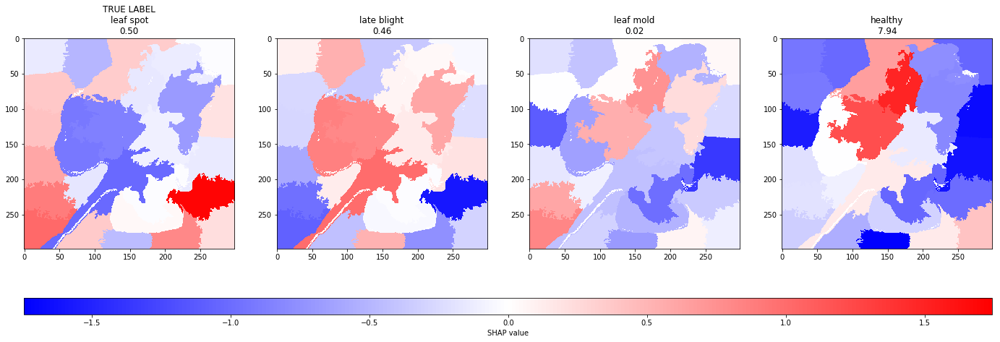

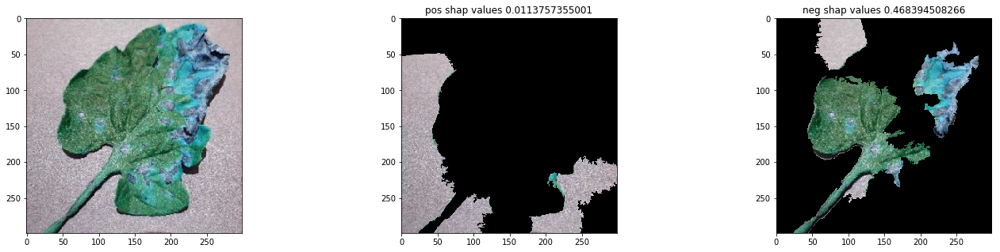

Plotting : 780


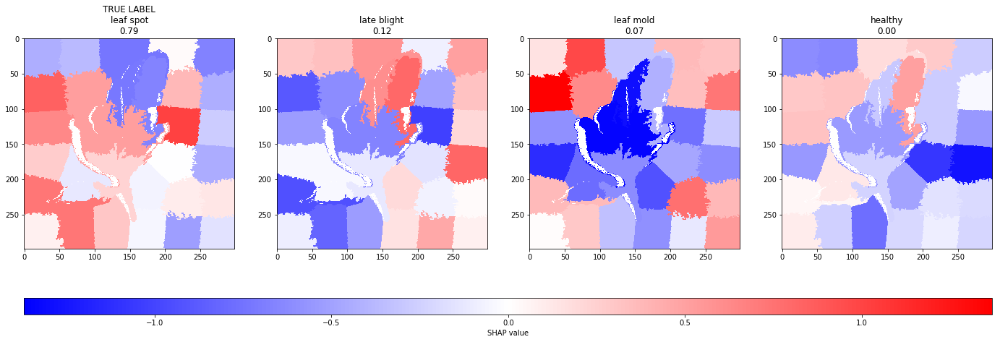

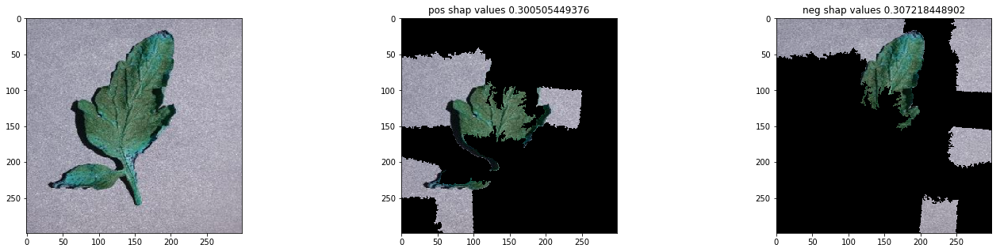

In [22]:
class_names={0:'late blight',1:'leaf mold',2:'leaf spot',3:'healthy'}
from matplotlib import cm
for i in sorted(dictt.keys())[::20]:
    img = dictt[i][0]
    phi = dictt[i][1]
    actual_class = class_names[np.argmax(y_val[i])]
    preds = model.predict(np.array([img]))[0]
    if max(preds) < 0.9: # for less confident predictions
        print 'Plotting :',i
        if actual_class != class_names[np.argmax(preds)]:
            print 'THE FOLLOWING WAS PREDICTED WRONGLY'
        max_val = max(np.abs(np.concatenate(phi)))
        segments_slic = dictt[i][2]
        new_image = np.zeros((299,299))
        f,ax = plt.subplots(1,4,figsize=(12*2,2*4.2))
        counter  = 3
        for ii in np.argsort(preds)[::]:
          for j in range(299):
            for k in range(299):
              new_image[j,k] = phi[ii][segments_slic[j,k]]
          if class_names[ii] == actual_class:
              ax[counter].set_title('TRUE LABEL\n'+class_names[ii]+'\n'+str(preds[ii])[:4]   )
          else:
              ax[counter].set_title(class_names[ii]+'\n'+str(preds[ii])[:4]   )
          cax = ax[counter].imshow( (np.mean(img,-1) > 0.1)*1*new_image, 
                                   vmin=-max_val, vmax=max_val,cmap = plt.cm.bwr)
          counter += -1
        cb = plt.colorbar(cax,  ax=ax.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
        #cbar = plt.colorbar(cax,ticks=[-1.5,-1,-0.75,-0.5,-0.25, 0,.25,.5, 75, 1,1.5], orientation='horizontal')
        plt.show()
        f,ax = plt.subplots(1,3,figsize=(12*2,2*2.5))
        ax[0].imshow(img)
        lower_bd = np.percentile(np.concatenate(new_image),30)
        upper_bd = np.percentile(np.concatenate(new_image),70)
        new_image= np.stack([new_image]*3,-1)
        shap_pos_img = (new_image > upper_bd)
        shap_neg_img = (new_image < lower_bd)
        mask = get_approx_mask(i)
        pos_shap_and_leaf = shap_pos_img[:,:,0]*mask
        neg_shap_and_leaf = shap_neg_img[:,:,0]*mask
        ax[1].imshow(img*shap_pos_img)
        ax[1].set_title('pos shap values %s' %(1.0*np.sum(pos_shap_and_leaf)/np.sum(mask)))
        ax[2].imshow(img*shap_neg_img)
        ax[2].set_title('neg shap values %s' %(1.0*np.sum(neg_shap_and_leaf)/np.sum(mask)))
        plt.show()


THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 15


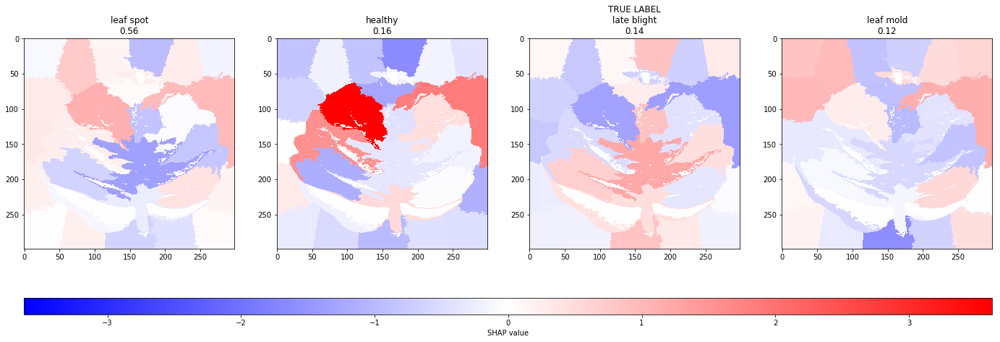

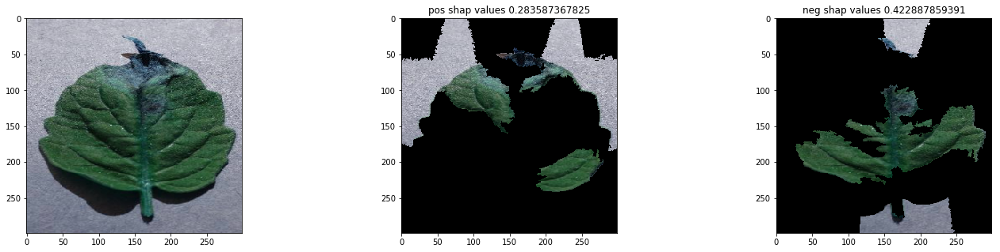

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 24


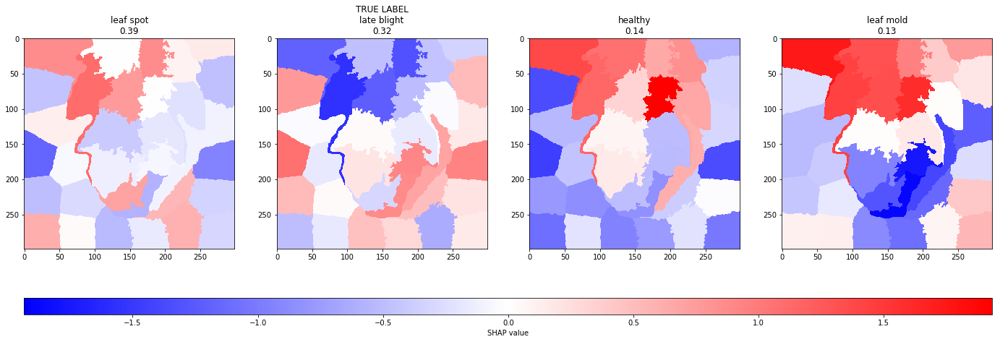

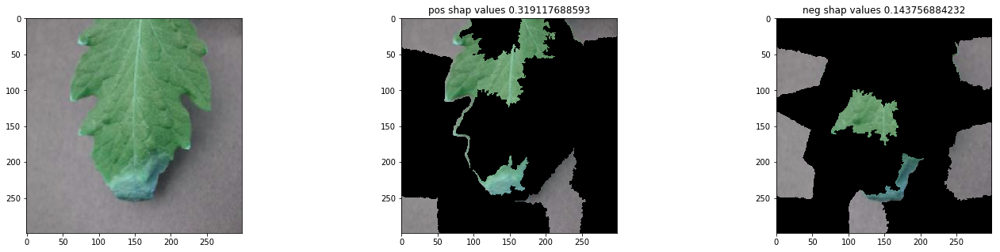

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 45


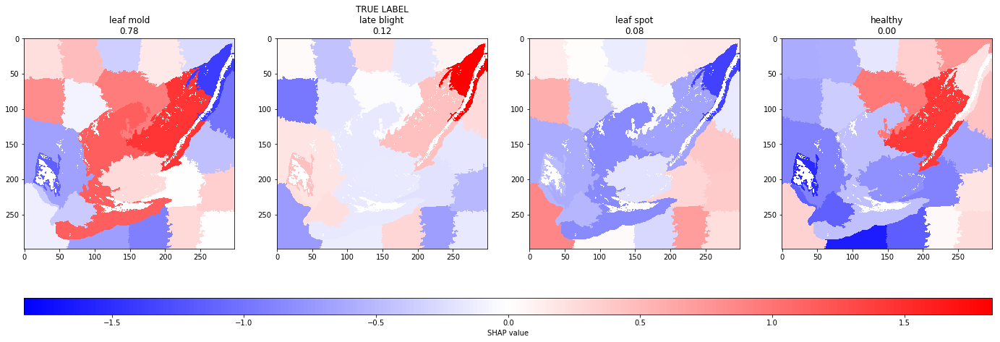

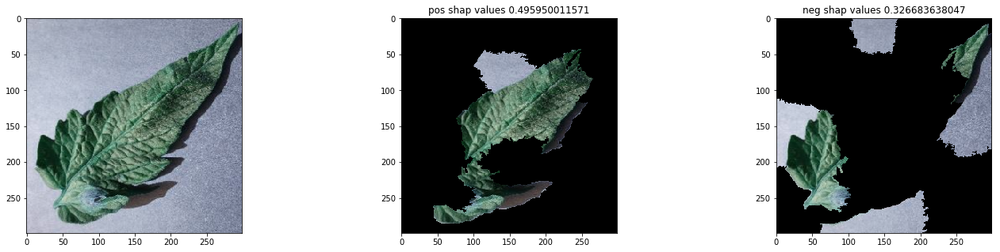

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 78


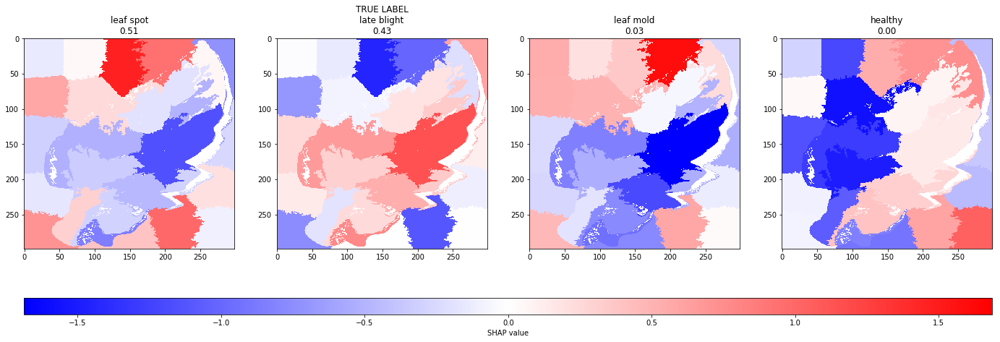

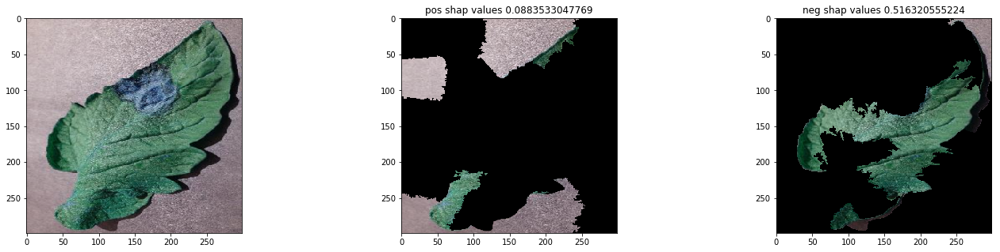

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 201


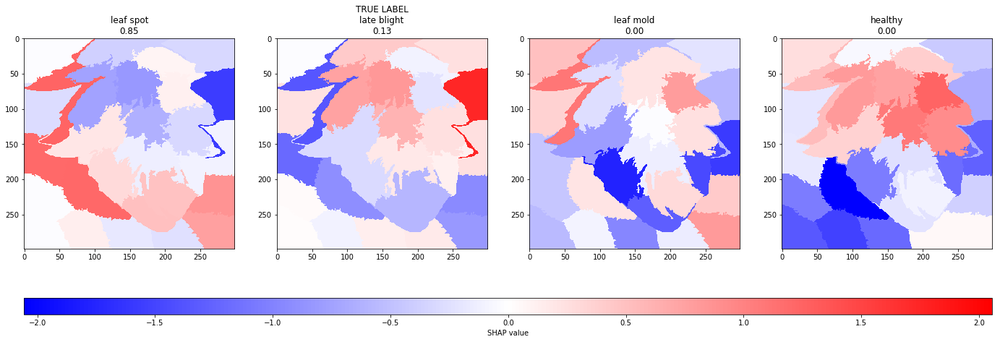

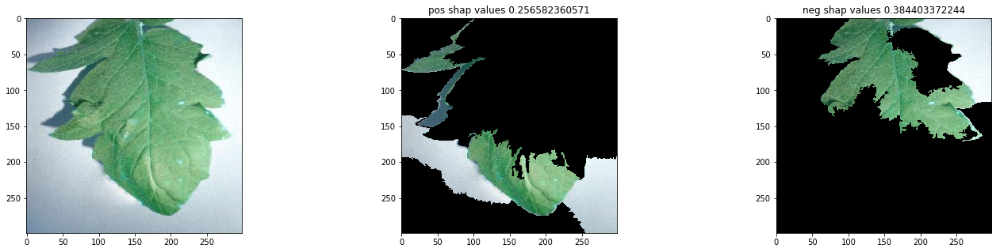

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 276


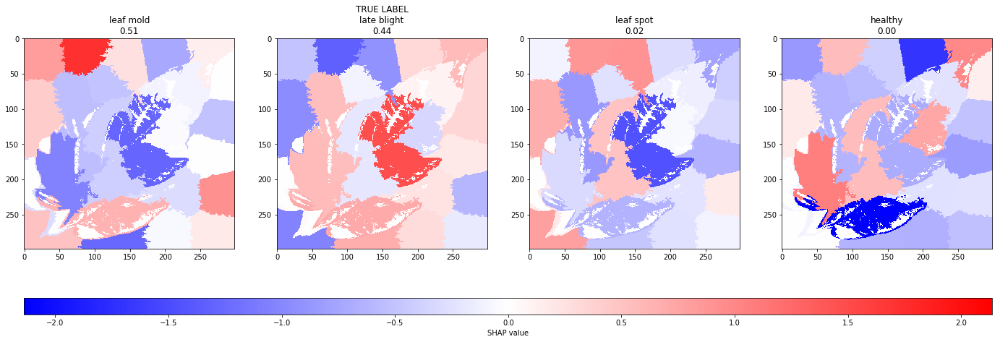

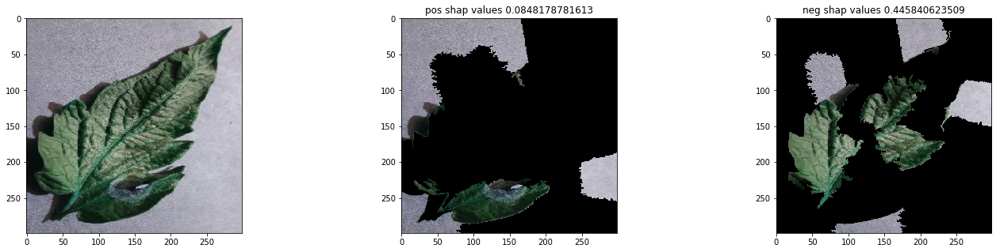

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 312


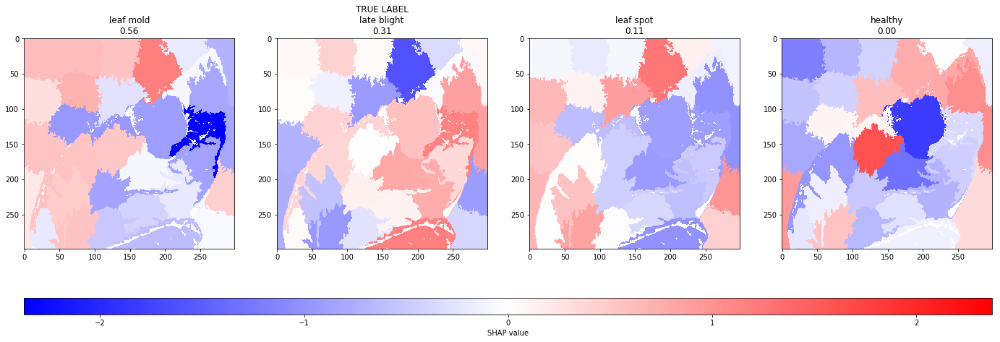

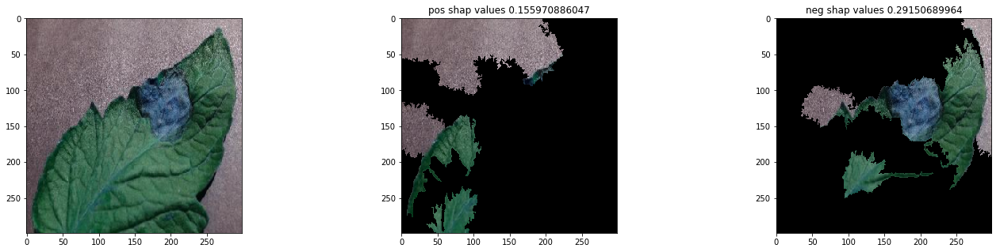

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 381


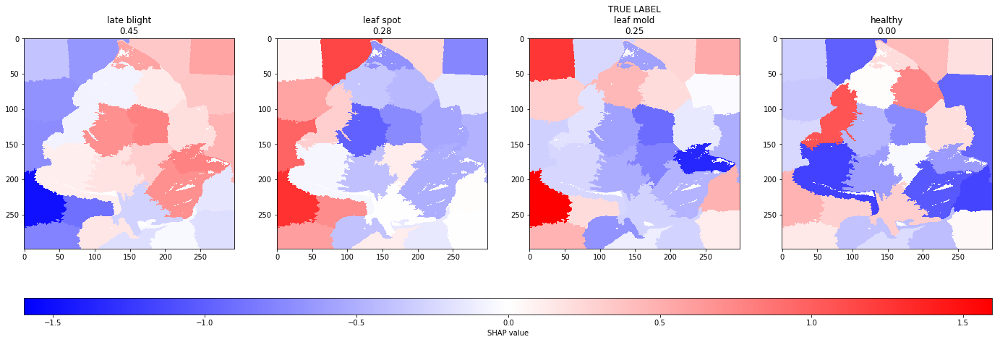

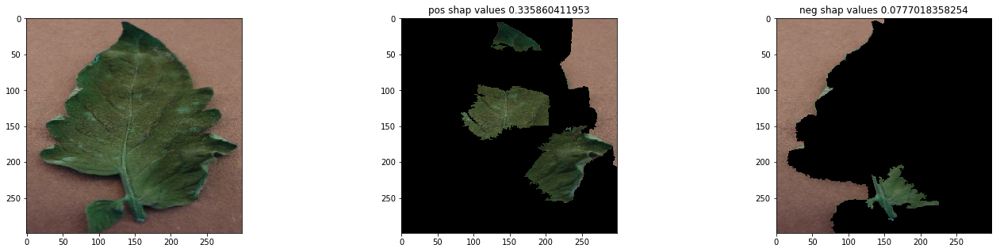

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 399


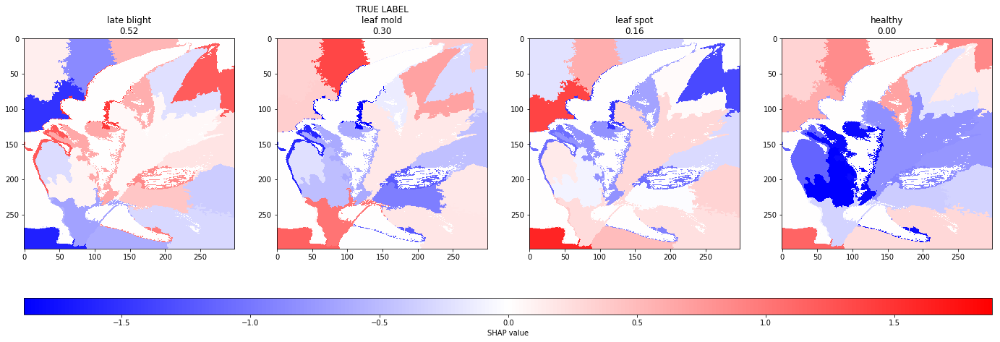

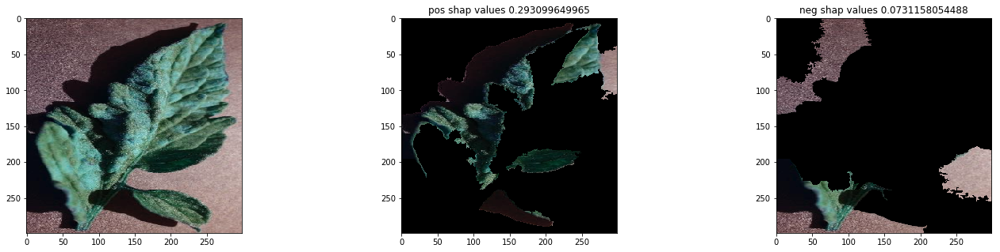

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 405


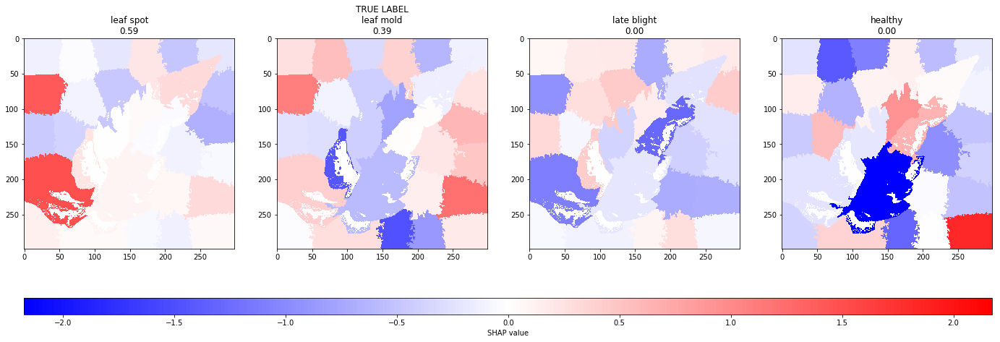

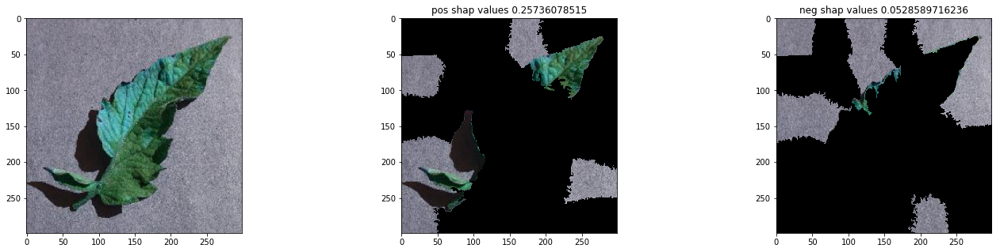

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 408


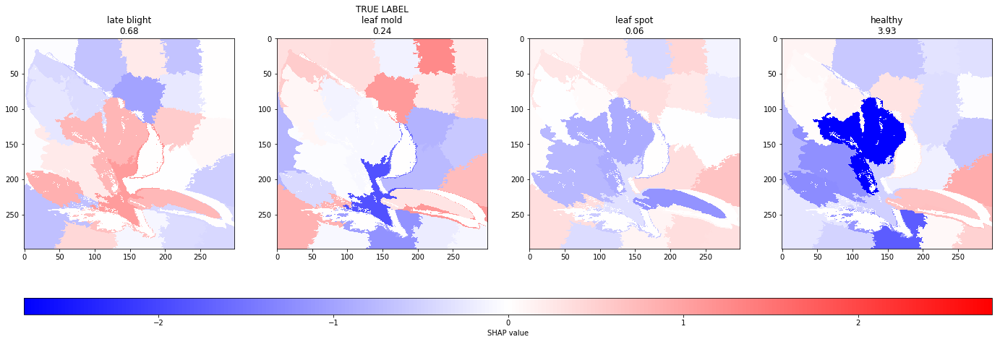

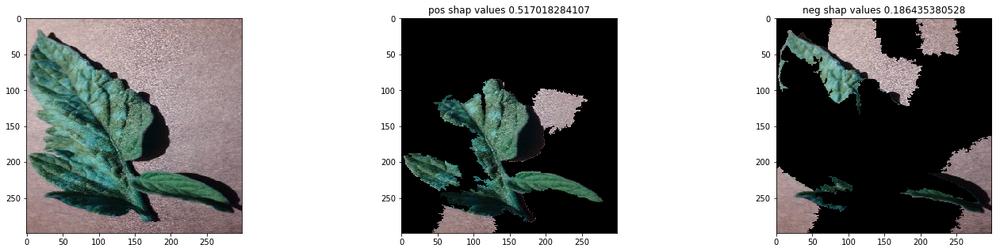

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 411


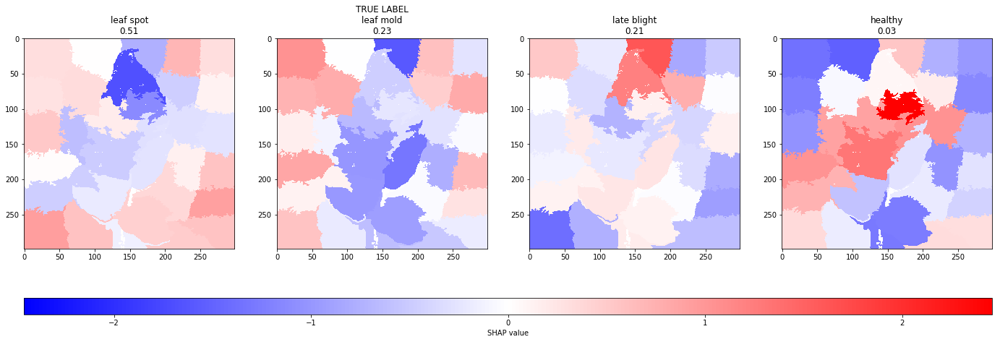

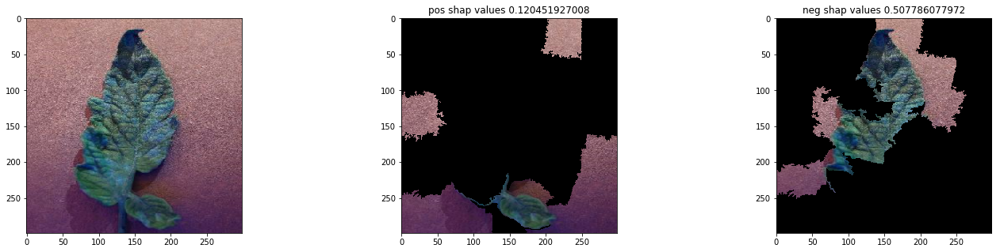

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 423


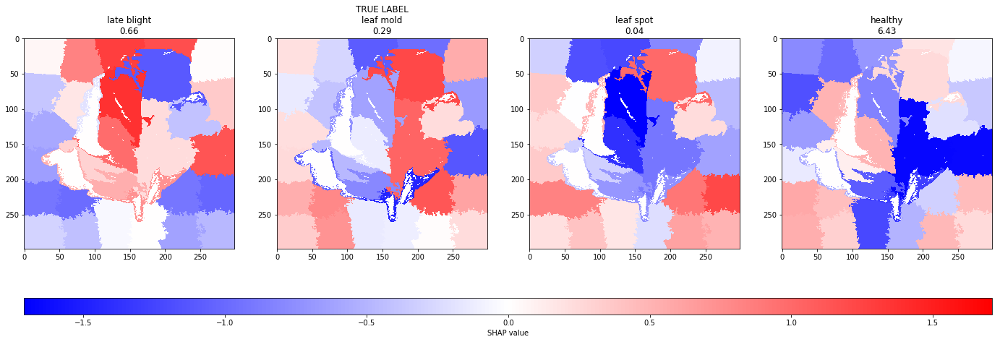

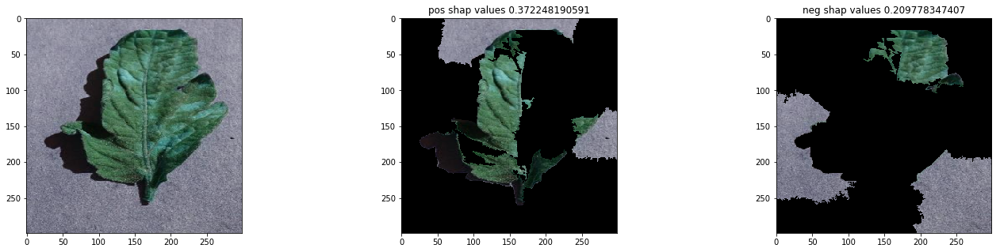

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 441


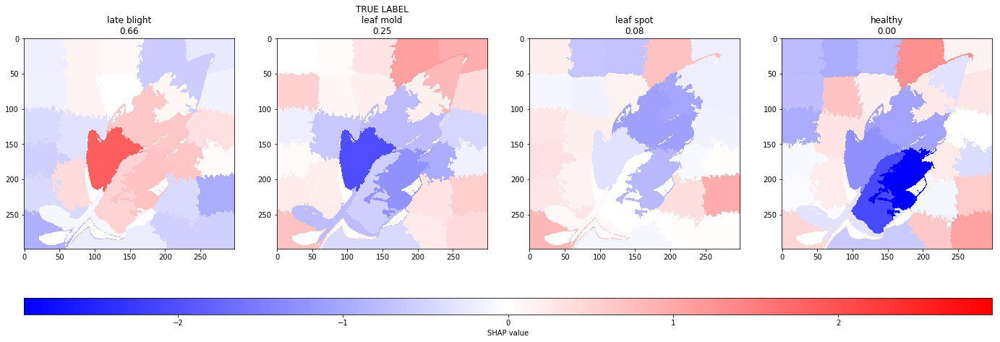

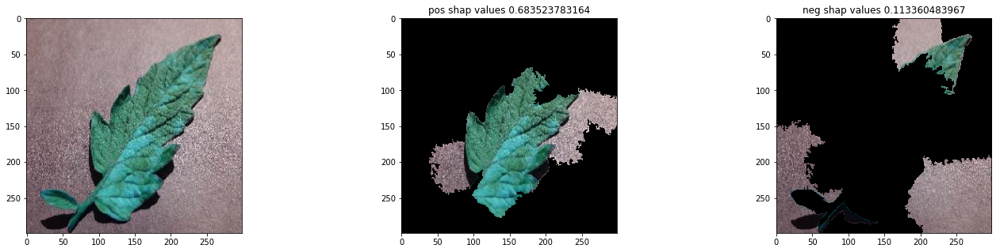

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 456


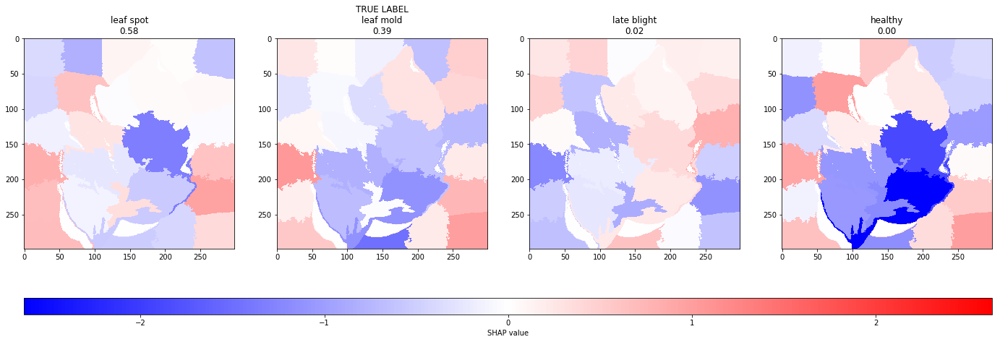

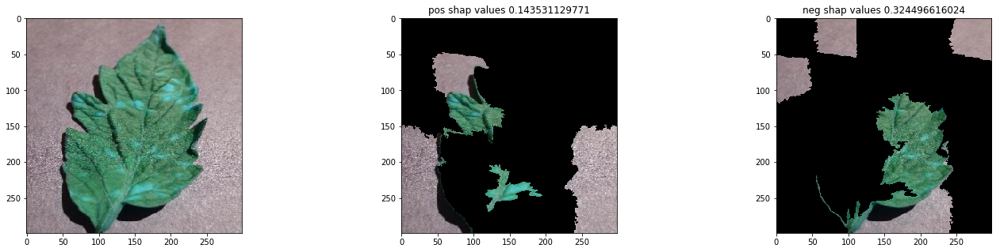

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 474


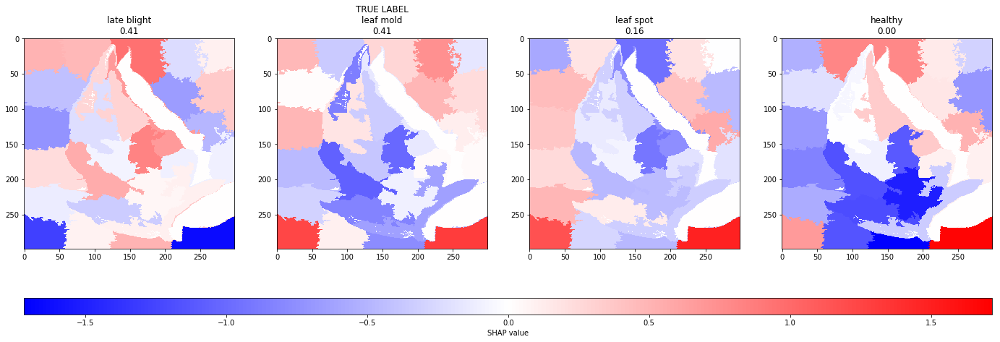

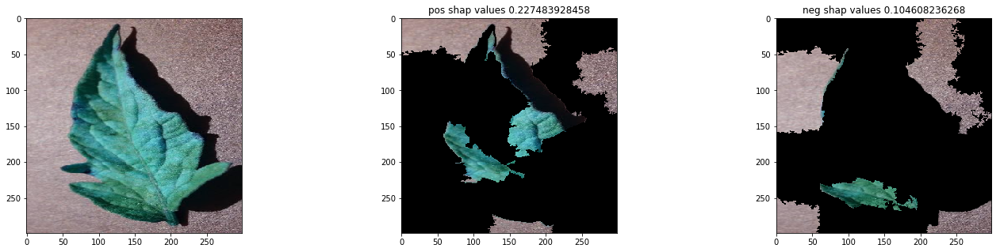

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 498


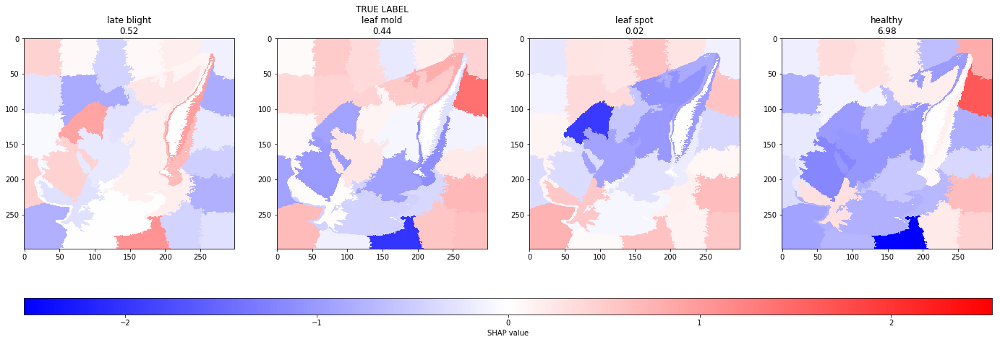

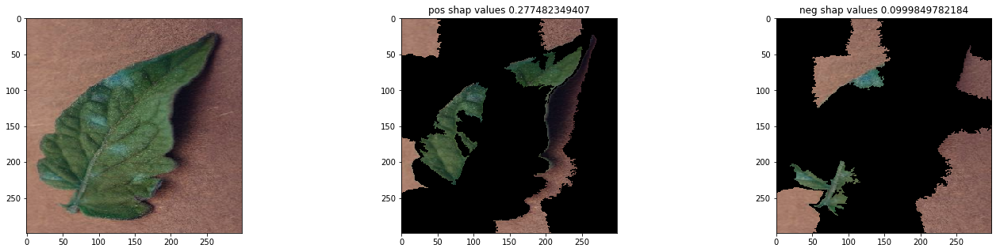

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 504


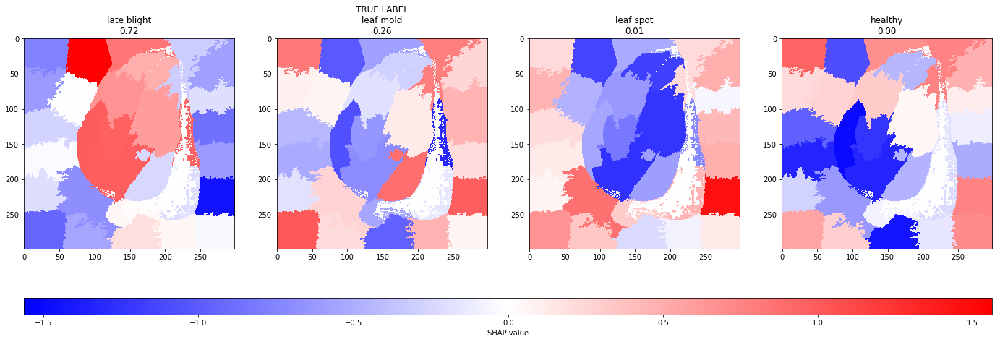

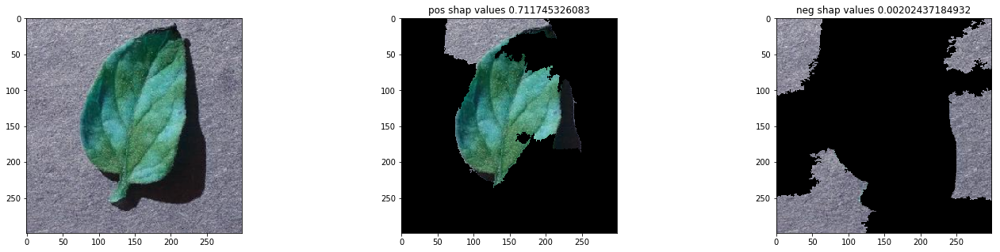

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 510


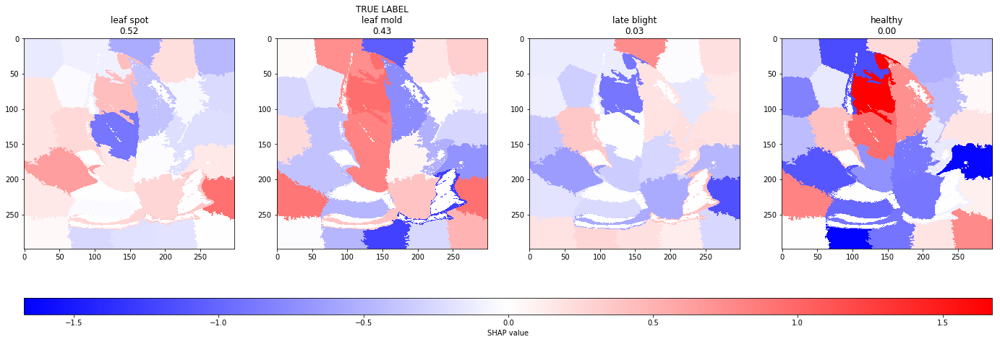

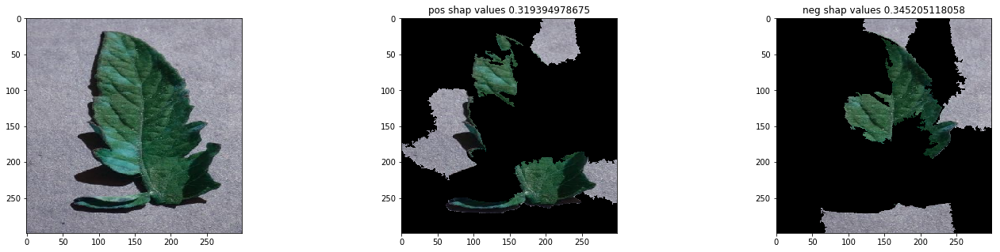

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 582


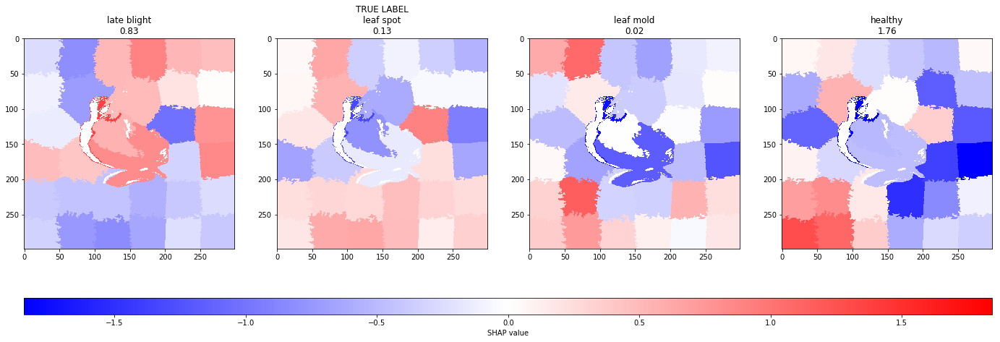

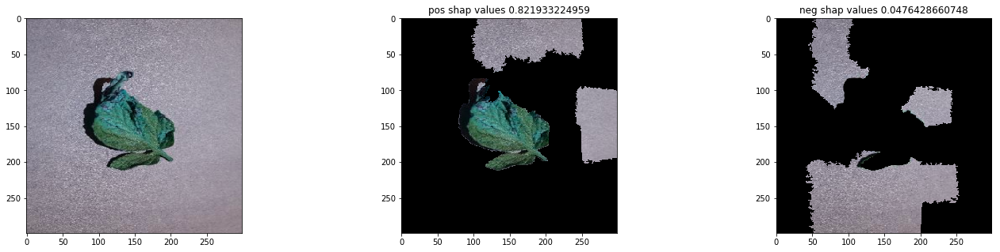

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 588


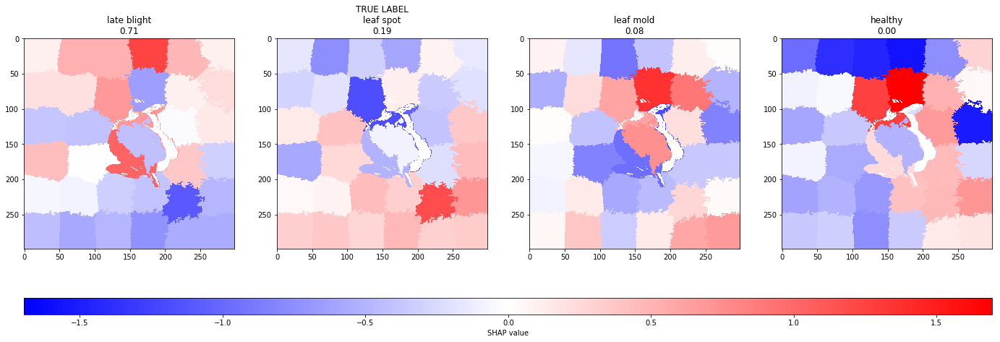

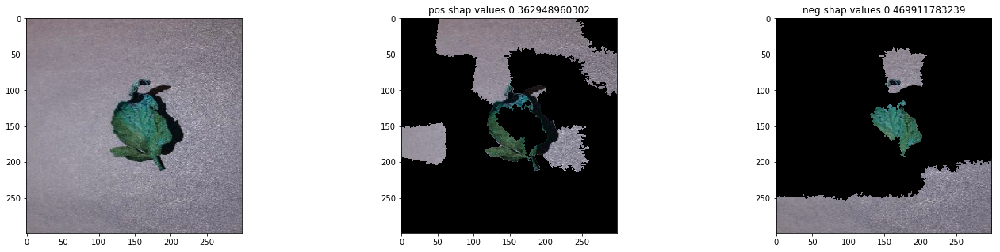

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 660


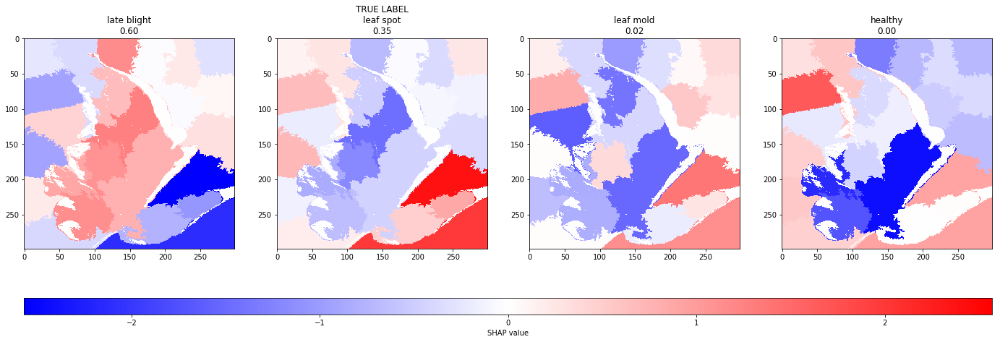

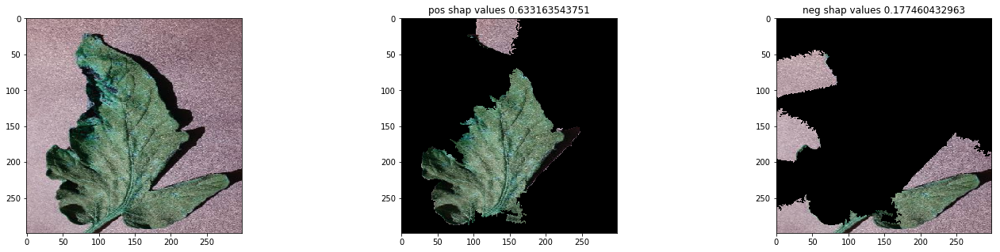

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 759


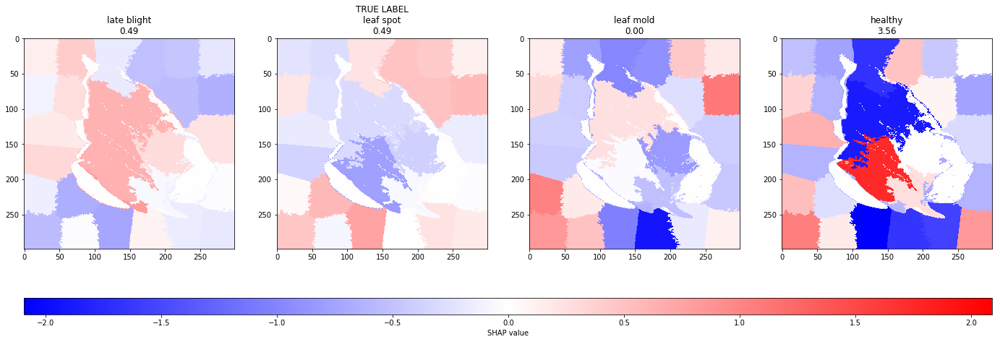

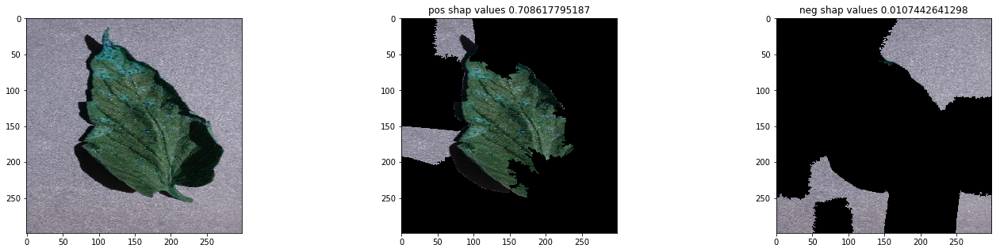

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 831


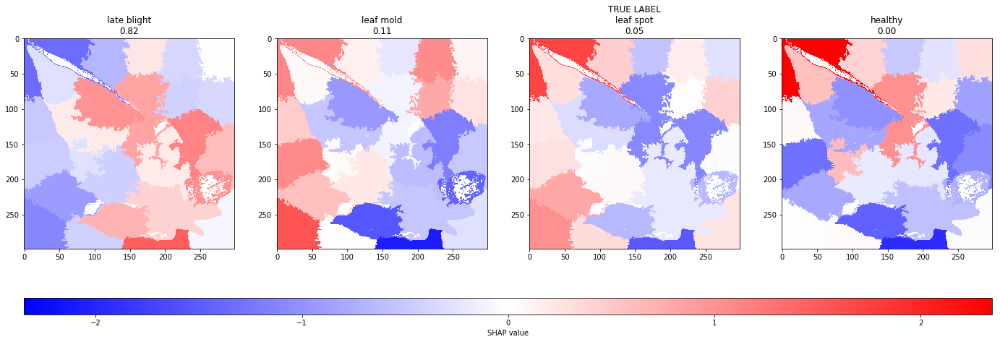

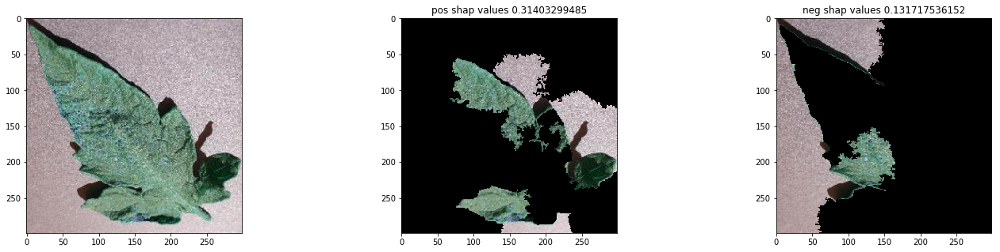

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 882


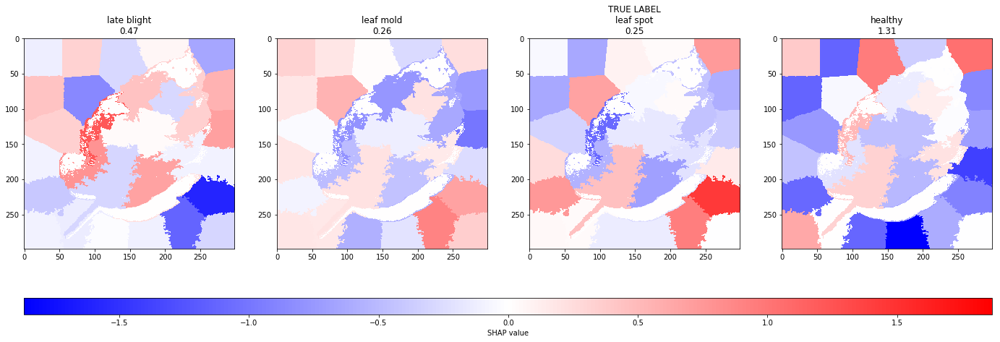

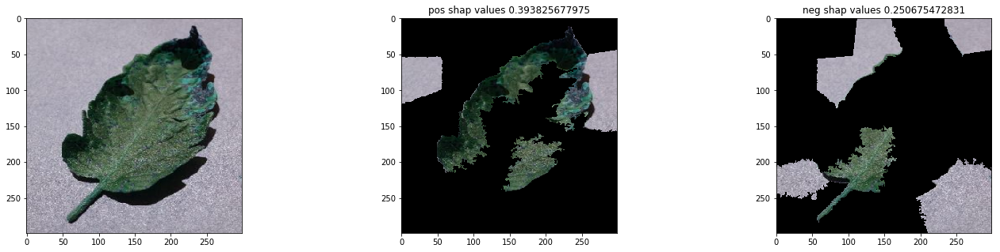

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 897


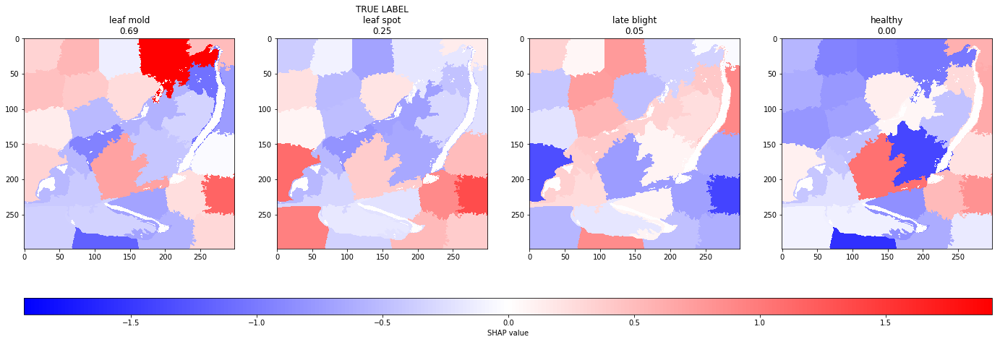

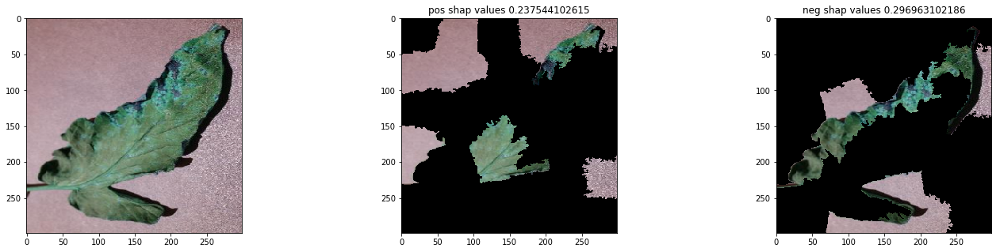

THE FOLLOWING WAS PREDICTED WRONGLY
Plotting : 1053


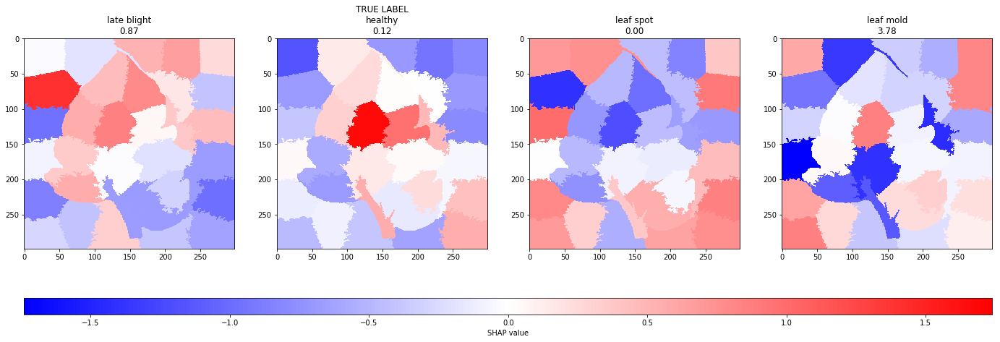

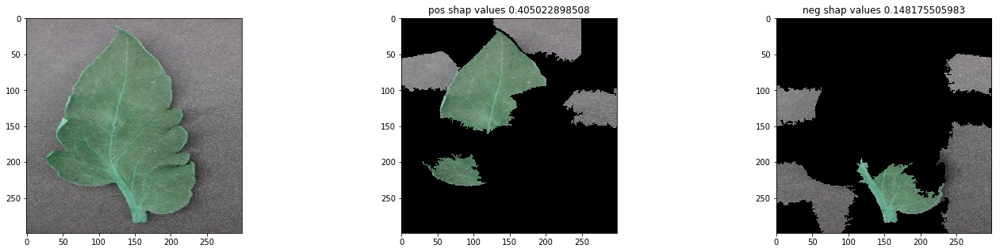

In [86]:
class_names={0:'late blight',1:'leaf mold',2:'leaf spot',3:'healthy'}
from matplotlib import cm
for i in sorted(dictt.keys())[::]:
    img = dictt[i][0]
    phi = dictt[i][1]
    actual_class = class_names[np.argmax(y_val[i])]
    preds = model.predict(np.array([img]))[0]
    if actual_class != class_names[np.argmax(preds)]: #for wrongly predicted classes
        print 'THE FOLLOWING WAS PREDICTED WRONGLY'
        print 'Plotting :',i
        max_val = max(np.abs(np.concatenate(phi)))
        segments_slic = dictt[i][2]
        new_image = np.zeros((299,299))
        f,ax = plt.subplots(1,4,figsize=(12*2,2*4.2))
        counter  = 3
        for ii in np.argsort(preds)[::]:
          for j in range(299):
            for k in range(299):
              new_image[j,k] = phi[ii][segments_slic[j,k]]
          if class_names[ii] == actual_class:
              ax[counter].set_title('TRUE LABEL\n'+class_names[ii]+'\n'+str(preds[ii])[:4]   )
          else:
              ax[counter].set_title(class_names[ii]+'\n'+str(preds[ii])[:4]   )
          cax = ax[counter].imshow( (np.mean(img,-1) > 0.1)*1*new_image, 
                                   vmin=-max_val, vmax=max_val,cmap = plt.cm.bwr)
          counter += -1
        cb = plt.colorbar(cax,  ax=ax.ravel().tolist(), label="SHAP value", orientation="horizontal", aspect=60)
        #cbar = plt.colorbar(cax,ticks=[-1.5,-1,-0.75,-0.5,-0.25, 0,.25,.5, 75, 1,1.5], orientation='horizontal')
        plt.show()
        f,ax = plt.subplots(1,3,figsize=(12*2,2*2.5))
        ax[0].imshow(img)
        lower_bd = np.percentile(np.concatenate(new_image),30)
        upper_bd = np.percentile(np.concatenate(new_image),70)
        new_image= np.stack([new_image]*3,-1)
        shap_pos_img = (new_image > upper_bd)
        shap_neg_img = (new_image < lower_bd)
        mask = get_approx_mask(i)
        pos_shap_and_leaf = shap_pos_img[:,:,0]*mask
        neg_shap_and_leaf = shap_neg_img[:,:,0]*mask
        ax[1].imshow(img*shap_pos_img)
        ax[1].set_title('pos shap values %s' %(1.0*np.sum(pos_shap_and_leaf)/np.sum(mask)))
        ax[2].imshow(img*shap_neg_img)
        ax[2].set_title('neg shap values %s' %(1.0*np.sum(neg_shap_and_leaf)/np.sum(mask)))
        plt.show()


### 4. Correlating % of leaf cover in negative/positive shapley areas to similarity to training set (in progress)
Intuitively the leaf should be largely (negative or positve), and background should be close to 0
But it is not, so trying to find out why

In [178]:
dictt= np.load(gzip.GzipFile('dictt_BetterSampling_100_bk0.npy.gz')).item()
class_names={0:'late blight',1:'leaf mold',2:'leaf spot',3:'healthy'}
from matplotlib import cm
for i in sorted(dictt.keys())[::]:
    img = dictt[i][0]
    phi = dictt[i][1]
    actual_class = class_names[np.argmax(y_val[i])]
    preds = model.predict(np.array([img]))[0]
    if max(preds) < 90.9:
        #print 'Plotting :',i
        if actual_class != class_names[np.argmax(preds)]:
            print 'THE FOLLOWING WAS PREDICTED WRONGLY',i
        max_val = max(np.abs(np.concatenate(phi)))
        segments_slic = dictt[i][2]
        new_image = np.zeros((299,299))
        counter  = 3
        for ii in np.argsort(preds)[::]:
          for j in range(299):
            for k in range(299):
              new_image[j,k] = phi[ii][segments_slic[j,k]]
          counter += -1
        lower_bd = np.percentile(np.concatenate(new_image),30)
        upper_bd = np.percentile(np.concatenate(new_image),70)
        new_image= np.stack([new_image]*3,-1)
        shap_pos_img = (new_image > upper_bd)
        shap_neg_img = (new_image < lower_bd)
        mask = get_approx_mask(i)
        pos_shap_and_leaf = shap_pos_img[:,:,0]*mask
        neg_shap_and_leaf = shap_neg_img[:,:,0]*mask
        percent_mask_with_shap = [0,0,0,0]
        percent_mask_with_shap[0] = ((1.0*np.sum(neg_shap_and_leaf)+0*np.sum(pos_shap_and_leaf))/np.sum(mask))
        percent_mask_with_shap[1] = ((0*np.sum(neg_shap_and_leaf)+1.0*np.sum(pos_shap_and_leaf))/np.sum(mask))
        percent_mask_with_shap[2] = (1.0*(np.sum(pos_shap_and_leaf))/np.sum(shap_pos_img[:,:,0]))
        percent_mask_with_shap[3]= (1.0*(np.sum(neg_shap_and_leaf))/np.sum(shap_neg_img[:,:,0]))
        if len(dictt[i]) == 4:
            dictt[i] += [percent_mask_with_shap,preds]

THE FOLLOWING WAS PREDICTED WRONGLY 15
THE FOLLOWING WAS PREDICTED WRONGLY 24
THE FOLLOWING WAS PREDICTED WRONGLY 45
THE FOLLOWING WAS PREDICTED WRONGLY 78
THE FOLLOWING WAS PREDICTED WRONGLY 201
THE FOLLOWING WAS PREDICTED WRONGLY 276
THE FOLLOWING WAS PREDICTED WRONGLY 312
THE FOLLOWING WAS PREDICTED WRONGLY 381
THE FOLLOWING WAS PREDICTED WRONGLY 399
THE FOLLOWING WAS PREDICTED WRONGLY 405
THE FOLLOWING WAS PREDICTED WRONGLY 408
THE FOLLOWING WAS PREDICTED WRONGLY 411
THE FOLLOWING WAS PREDICTED WRONGLY 423
THE FOLLOWING WAS PREDICTED WRONGLY 441
THE FOLLOWING WAS PREDICTED WRONGLY 456
THE FOLLOWING WAS PREDICTED WRONGLY 474
THE FOLLOWING WAS PREDICTED WRONGLY 498
THE FOLLOWING WAS PREDICTED WRONGLY 504
THE FOLLOWING WAS PREDICTED WRONGLY 510
THE FOLLOWING WAS PREDICTED WRONGLY 582
THE FOLLOWING WAS PREDICTED WRONGLY 588
THE FOLLOWING WAS PREDICTED WRONGLY 660
THE FOLLOWING WAS PREDICTED WRONGLY 759
THE FOLLOWING WAS PREDICTED WRONGLY 831
THE FOLLOWING WAS PREDICTED WRONGLY 882
THE 

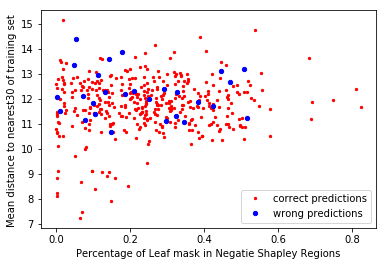

[[1.         0.08539456]
 [0.08539456 1.        ]]
[[ 1.         -0.10022692]
 [-0.10022692  1.        ]]


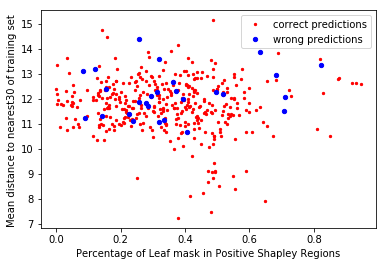

[[ 1.         -0.07023696]
 [-0.07023696  1.        ]]
[[1.         0.19208624]
 [0.19208624 1.        ]]


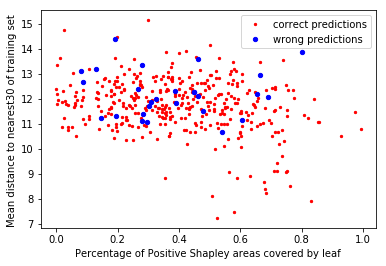

[[ 1.         -0.25411088]
 [-0.25411088  1.        ]]
[[ 1.         -0.00476931]
 [-0.00476931  1.        ]]


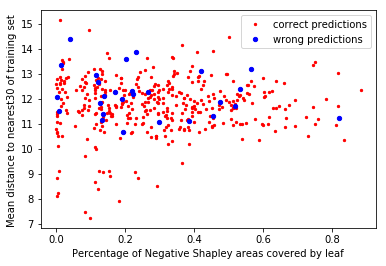

[[1.         0.02108926]
 [0.02108926 1.        ]]
[[ 1.         -0.21616668]
 [-0.21616668  1.        ]]


In [180]:
for i in dictt.keys():
    embed = X_val_output2[i]
    avg_dist = np.mean(sorted(np.sum((X_tr_output2 - embed)**2,1)**.5)[:30])
    num_below_11 = np.sum((np.sum((X_tr_output2 - embed)**2,1)**.5) <  11 )
    if   num_below_11 > 300:
        print i, sorted(np.sum((X_tr_output2 - embed)**2,1)**.5)
        plt.imshow(dictt[i][0])
        plt.show()
        closest = np.argsort(np.sum((X_tr_output2 - embed)**2,1)**.5)
        plt.imshow(X_tr[closest[0]])
        plt.show()
        plt.imshow(X_tr[closest[1]])
        plt.show()
        plt.imshow(X_tr[closest[3]])
        plt.show()
        plt.imshow(X_tr[closest[4]])
        plt.show()
    if len(dictt[i]) == 6:
        dictt[i] += [avg_dist]
    elif len(dictt[i]) == 7:
        dictt[i][-1] = avg_dist
for i in range(4):
    names = ['Leaf mask in Negatie Shapley Regions',
             'Leaf mask in Positive Shapley Regions',
            'Positive Shapley areas covered by leaf',
            'Negative Shapley areas covered by leaf']
    plt.plot([dictt[x][-3][i] for x in dictt],[np.max(dictt[x][-1]) for x in dictt],
             'ro',markersize=2.3,label='correct predictions')
    plt.plot([dictt[x][-3][i] for x in dictt if np.argmax(dictt[x][-2] )!= np.argmax(dictt[x][-4]) ],
         [np.max(dictt[x][-1]) for x in dictt if np.argmax(dictt[x][-2] )!= np.argmax(dictt[x][-4])],
         'bo',markersize=4.3, label = 'wrong predictions') #wrong cases seem to be confused about which disease, leaf covergage is thus simillar ?
    plt.xlabel('Percentage of %s' %names[i])
    plt.ylabel('Mean distance to nearest30 of training set ')
    plt.legend()
    plt.show()
    print np.corrcoef([dictt[x][-3][i] for x in dictt],[np.max(dictt[x][-1]) for x in dictt])
    print np.corrcoef([dictt[x][-3][i] for x in dictt if np.argmax(dictt[x][-2] )!= np.argmax(dictt[x][-4]) ],
         [np.max(dictt[x][-1]) for x in dictt if np.argmax(dictt[x][-2] )!= np.argmax(dictt[x][-4])])

In [13]:
model2 = Model(Input_model,output2) #using logits layer
model2.compile(loss = "categorical_crossentropy",
                    optimizer = 'adam',#ptimizers.SGD(lr=0.1),
                    metrics=['categorical_crossentropy',"accuracy"])

In [173]:
#X_val_output2 = model2.predict(X_val[::],batch_size=16*3)
#X_tr_output2 = model2.predict(X_tr,batch_size=16*3)
np.save( 'X_val_output2.npy',X_val_output2 )
np.save( 'X_tr_output2.npy', X_tr_output2 )

In [87]:
#sorted(np.sum((X_tr_output2 - embed)**2,1)**.5)

In [123]:
for i in dictt.keys():
    embed = X_val_output2[i]
    avg_dist = np.mean(sorted(np.sum((X_tr_output2 - embed)**2,1)**.5)[:5:])
    num_below_11 = np.sum((np.sum((X_tr_output2 - embed)**2,1)**.5) <  11 )
    if   num_below_11 > 300:
        print i, sorted(np.sum((X_tr_output2 - embed)**2,1)**.5)
        plt.imshow(dictt[i][0])
        plt.show()
        closest = np.argsort(np.sum((X_tr_output2 - embed)**2,1)**.5)
        plt.imshow(X_tr[closest[0]])
        plt.show()
        plt.imshow(X_tr[closest[1]])
        plt.show()
        plt.imshow(X_tr[closest[3]])
        plt.show()
        plt.imshow(X_tr[closest[4]])
        plt.show()
    if len(dictt[i]) == 6:
        dictt[i] += [avg_dist]
    elif len(dictt[i]) == 7:
        dictt[i][-1] =avg_dist# num_below_11# avg_dist

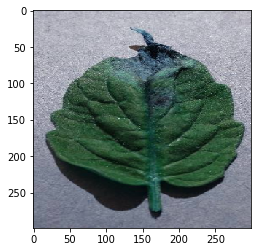

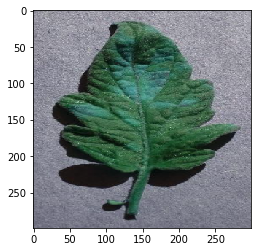

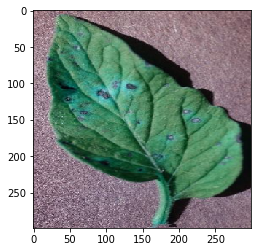

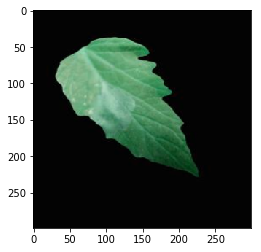

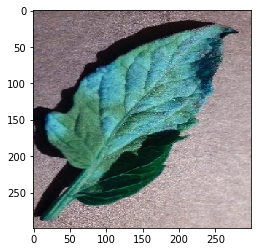

 [365 653] [497 203]


In [41]:
if True:
    i = 15
    embed = X_val_output2[i]
    avg_dist = np.mean(sorted(np.sum((X_tr_output2 - embed)**2,1)**.5)[:1])
    if True:
        plt.imshow(dictt[i][0])
        plt.show()
        closest = np.argsort(np.sum((X_tr_output2 - embed)**2,1)**.5)
        plt.imshow(X_tr[closest[0]])
        plt.show()
        plt.imshow(X_tr[closest[1]])
        plt.show()
        plt.imshow(X_tr[closest[-1]])
        plt.show()
        plt.imshow(X_tr[closest[-2]])
        plt.show()
        print closest[:2],closest[-2:]
    if len(dictt[i]) == 6:
        dictt[i] += [avg_dist]
    elif len(dictt[i]) == 7:
        dictt[i][-1] = avg_dist

In [32]:
sorted(np.sum((X_tr_output2 - embed)**2,1)**.5)

[11.140519,
 11.16447,
 11.507147,
 11.587294,
 11.609472,
 11.766609,
 11.776979,
 11.788683,
 11.834509,
 11.958767,
 11.993756,
 12.055032,
 12.086112,
 12.087931,
 12.10159,
 12.117039,
 12.125029,
 12.152494,
 12.161523,
 12.16681,
 12.179129,
 12.188578,
 12.193697,
 12.200872,
 12.218248,
 12.219911,
 12.248075,
 12.262502,
 12.271829,
 12.27707,
 12.285163,
 12.2864,
 12.293176,
 12.322726,
 12.325621,
 12.330119,
 12.334913,
 12.346106,
 12.355526,
 12.378033,
 12.38071,
 12.407991,
 12.42708,
 12.432784,
 12.451458,
 12.461928,
 12.4758625,
 12.4833555,
 12.484977,
 12.502135,
 12.524442,
 12.527949,
 12.533289,
 12.533361,
 12.533472,
 12.555637,
 12.568999,
 12.590497,
 12.59611,
 12.601835,
 12.621309,
 12.636367,
 12.641347,
 12.656924,
 12.6580105,
 12.659597,
 12.661823,
 12.666919,
 12.672933,
 12.679114,
 12.679514,
 12.686656,
 12.707967,
 12.710867,
 12.716557,
 12.716794,
 12.718261,
 12.718491,
 12.732482,
 12.745055,
 12.745424,
 12.747603,
 12.748292,
 12.750593

In [ ]:
X_tr_output2

0


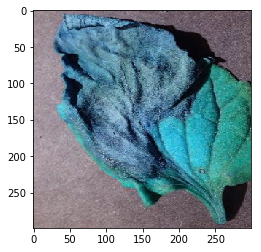

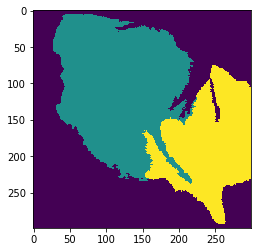

3


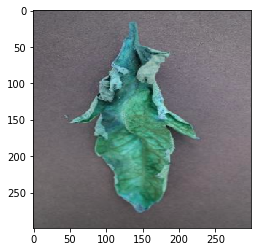

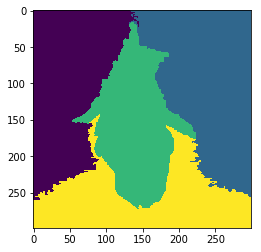

6


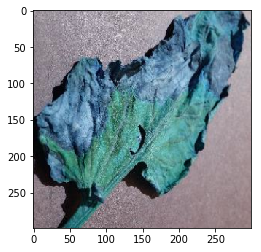

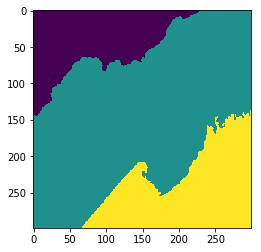

9


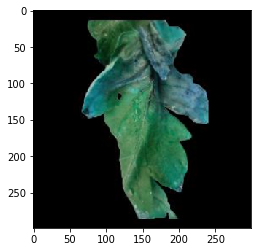

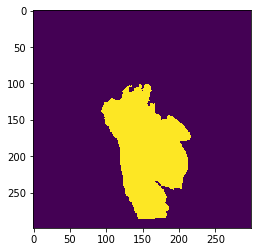

12


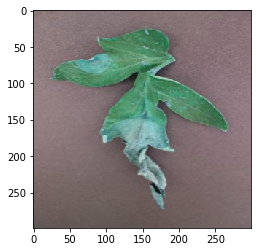

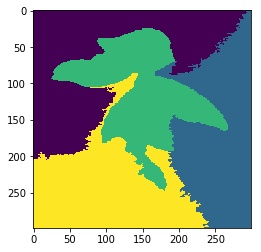

15


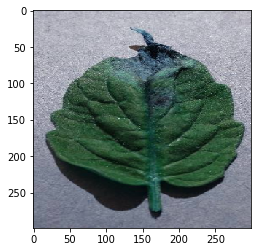

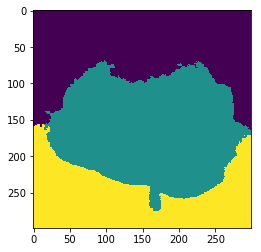

18


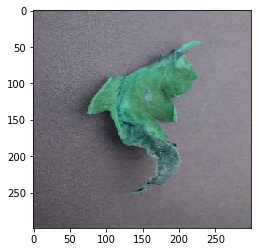

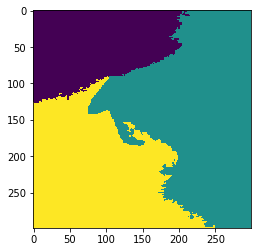

21


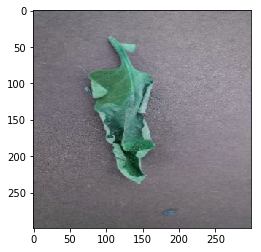

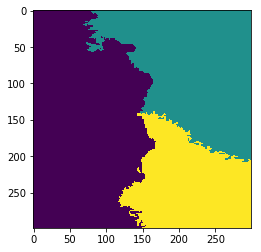

24


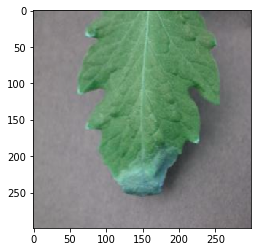

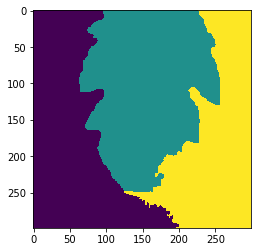

27


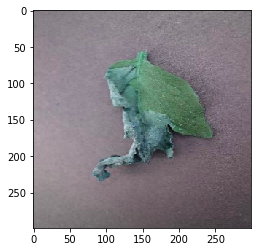

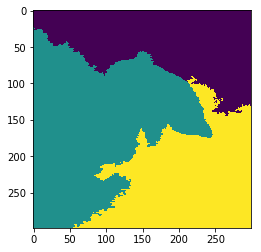

30


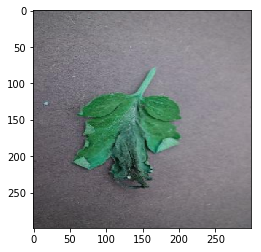

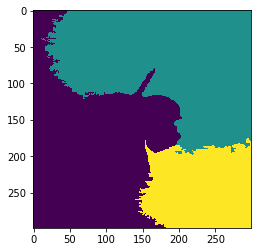

33


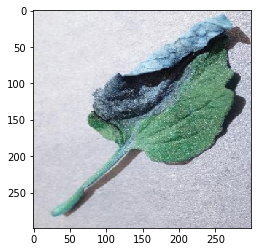

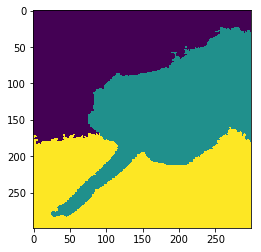

36


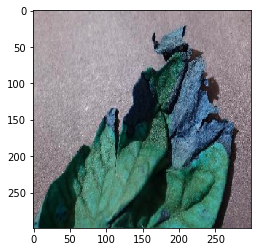

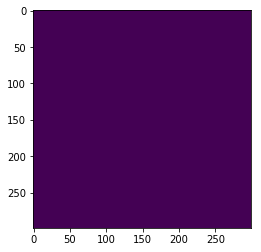

39


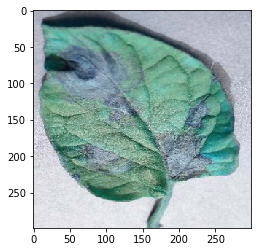

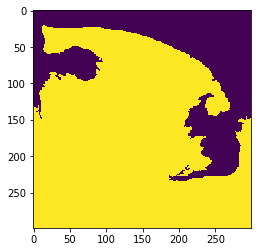

42


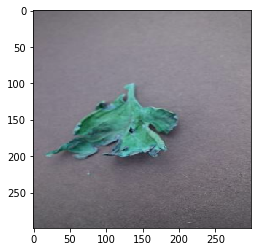

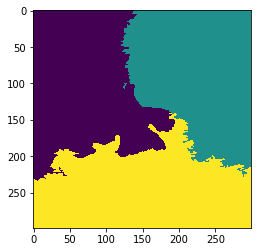

45


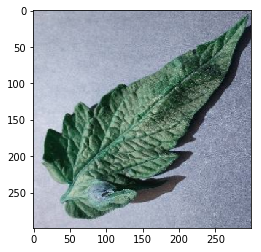

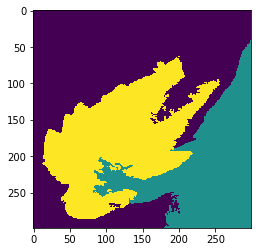

48


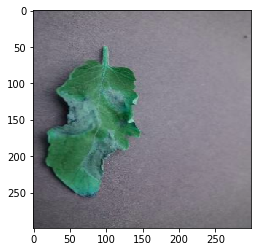

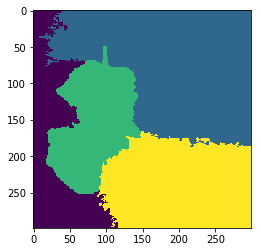

51


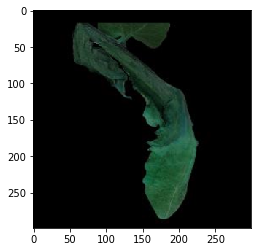

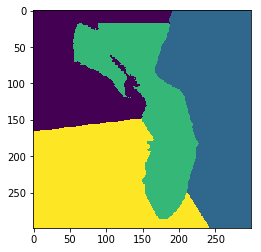

54


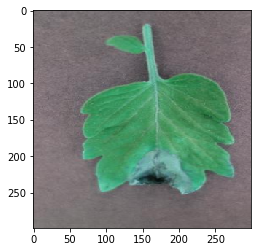

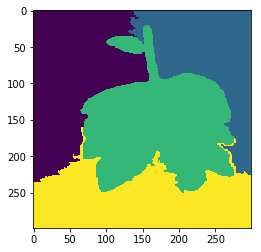

57


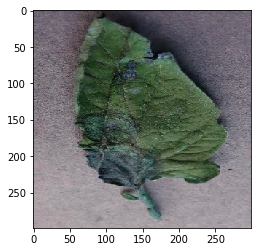

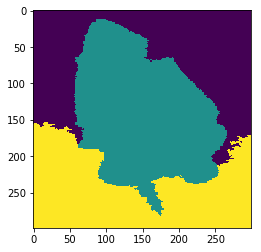

60


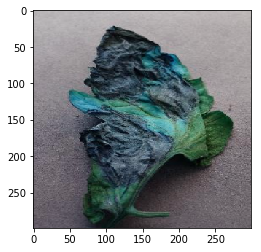

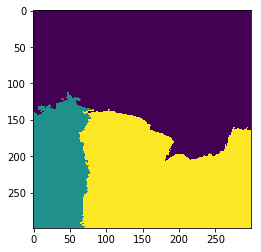

63


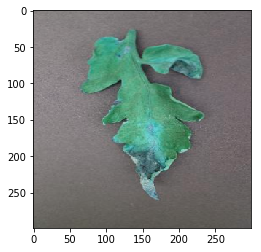

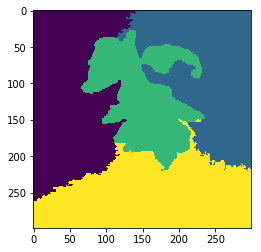

66


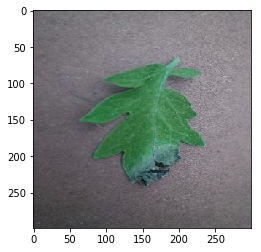

KeyboardInterrupt: 

In [20]:
# check for memorization
# find areas where positive is not leaf (using automated labelling)
import collections
for   i in dictt:
    x =  (dictt[i][0]*255).astype(np.uint8)
    #for j in range(3):
    #    print max(set(list(np.concatenate(x[:,:,j]))), key=list(np.concatenate(x[:,:,j])).count)
    if True: 
        print i
        plt.imshow(x);plt.show();
        plt.imshow((slic(x, n_segments=4, compactness=10, sigma=0)));plt.show()
        #(slic(x, n_segments=5, compactness=10, sigma=0))
    #if i == 30:
    #    die

In [ ]:
Hi Sam and Martin,

I would like to suggest myself for the tensorflow meetup talk after playing quite abit around shapley values from Scott M. Lundberg NIPS 2016 paper titled "A Unified Approach to Interpreting Model Predictions"

 :  Explainable AI : Using Shapley values